# **Blockbuster Insights: Unveiling Movie Success and Revenue Trends**

![Movie Poster](view-3d-cinema-theatre-room.jpg)

**Project Context**




In the dynamic world of cinema, understanding the elements that contribute to a movie's story, success, and revenue is invaluable. This project delves into a rich dataset containing detailed information on 45,000 movies, with the goal of extracting meaningful insights and building predictive models. The key objectives are:

**1. Story Exploration:** Analyze and summarize the storyline of movies using natural language processing (NLP) techniques.

**2. Classification:** Predict the success of movies based on various features.

**3. Regression:** Predict movie revenues using regression models.

This analysis aims to uncover trends, patterns, and actionable insights that can benefit film production, marketing strategies, and audience engagement.

## Dataset Overview

The dataset comprises 45,000 rows and 24 columns, each providing unique information about movies. Below is an overview of the columns:

| **Column Name**         | **Description**                                                             |
|--------------------------|-----------------------------------------------------------------------------|
| `adult`                 | Indicates whether the movie is adult-rated (True/False).                   |
| `belongs_to_collection` | The collection the movie belongs to, if any.                               |
| `budget`                | The budget of the movie in USD.                                            |
| `genres`                | The genres associated with the movie.                                      |
| `homepage`              | The official website of the movie.                                         |
| `id`                    | Unique identifier for the movie.                                           |
| `imdb_id`               | The IMDb ID for the movie.                                                 |
| `original_language`     | The language in which the movie was originally produced.                   |
| `original_title`        | The original title of the movie.                                           |
| `overview`              | A brief summary of the movie's plot.                                       |
| `popularity`            | A numeric score representing the movie's popularity.                       |
| `poster_path`           | The URL path to the movie's poster.                                        |
| `production_companies`  | The companies involved in producing the movie.                             |
| `production_countries`  | The countries where the movie was produced.                                |
| `release_date`          | The release date of the movie.                                             |
| `revenue`               | The revenue generated by the movie in USD.                                 |
| `runtime`               | The runtime of the movie in minutes.                                       |
| `spoken_languages`      | The languages spoken in the movie.                                         |
| `status`                | The current status of the movie (e.g., Released, Post-Production).         |
| `tagline`               | A tagline or slogan for the movie.                                         |
| `title`                 | The title of the movie.                                                    |
| `video`                 | Indicates whether a video exists (True/False).                             |
| `vote_average`          | The average rating of the movie.                                           |
| `vote_count`            | The number of votes the movie received.                                    |

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
import plotly.offline as py
pd.options.plotting.backend = "plotly"
py.init_notebook_mode(connected=True)
pd.set_option('display.max_colwidth', 50)
pd.set_option('display.max_columns', None)
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv("movies_metadata.csv")

In [4]:
df.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859495,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,[{'name': 'Twentieth Century Fox Film Corporat...,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"[{'name': 'Sandollar Productions', 'id': 5842}...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0


In [5]:
def missing_plot(dataset):
    null_feat = pd.DataFrame(dataset.isnull().sum(),columns=['Count'])
    null_percentage = pd.DataFrame(dataset.isnull().sum()/len(dataset),columns=['Count'])

    trace = go.Bar(x= null_feat.index, y = null_feat['Count'],opacity=0.8,
                  text = null_feat['Count'],textposition='auto',
                  marker=dict(color = '#D84E5F',
                             line = dict(color = '#000000',width = 1.5)))
    layout = dict(height=600,width = 1000,title = 'Missing values analysis by Barplot')
    
    fig = dict(data=[trace], layout= layout)
    
    py.iplot(fig)

def check(df_):
    print('SHAPE'.center(60,'*'))
    print('OBSERVATIONS -------->{}'.format(df_.shape[0]))
    print('FEATURES -------->{}'.format(df_.shape[1]))
    print('TYPES OF FETAURES'.center(60,'*'))
    print(df_.dtypes,'\n')
    print('Duplicate Values Analysis'.center(60,'*'))
    print('\n',df_.duplicated().sum(),'\n')
    print(''.center(60,'*'))

***************************SHAPE****************************
OBSERVATIONS -------->45466
FEATURES -------->24
*********************TYPES OF FETAURES**********************
adult                     object
belongs_to_collection     object
budget                    object
genres                    object
homepage                  object
id                        object
imdb_id                   object
original_language         object
original_title            object
overview                  object
popularity                object
poster_path               object
production_companies      object
production_countries      object
release_date              object
revenue                  float64
runtime                  float64
spoken_languages          object
status                    object
tagline                   object
title                     object
video                     object
vote_average             float64
vote_count               float64
dtype: object 

*****************Dupl

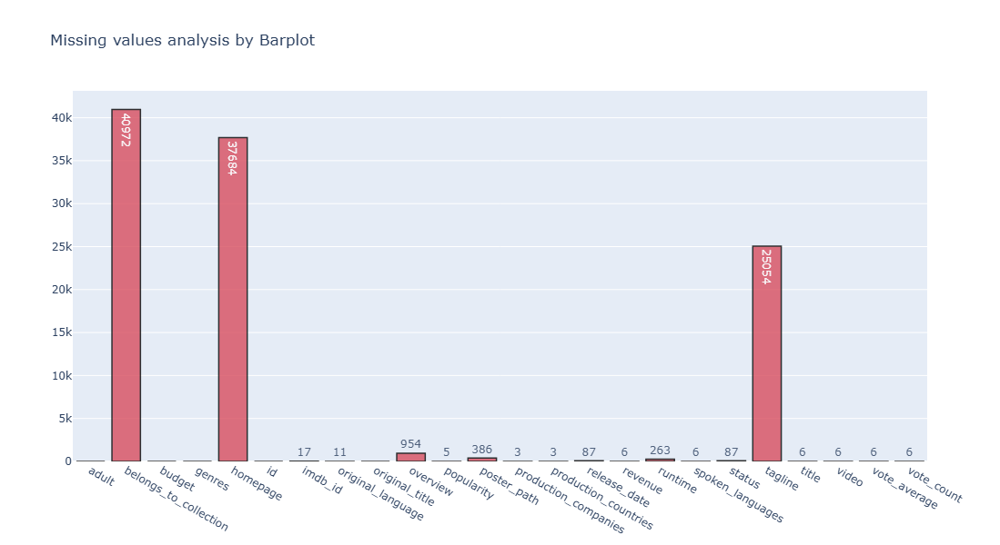

In [6]:
check(df)
missing_plot(df)

### Fill Missing Values

In [12]:
df['overview'] = df['overview'].fillna("No Overview Available")
df['tagline'] = df['tagline'].fillna("No Tagline Available")
df['genres'] = df['genres'].fillna("No Genres Available")

In [13]:
len(df[df['revenue'] == 0])

38052

In [14]:
df['revenue'] = df['revenue'].replace(0,np.nan)

In [19]:
df['budget'] = pd.to_numeric(df['budget'],errors='coerce')

In [21]:
df['budget'] = df['budget'].replace(0,np.nan)

In [23]:
df['return'] = df['revenue']/df['budget']

- 1 <  ---> Profit
- < 1 ---> Loss

In [26]:
df['return'].isnull().sum()

40085

We have data on the revenue and budget ratio for approximately 5,000 movies, representing nearly 10% of the entire dataset. While this may initially appear to be a modest proportion, it provides a robust foundation for conducting meaningful analyses and uncovering fascinating insights into the world of movies. This subset is substantial enough to identify trends, draw actionable conclusions, and gain a deeper understanding of the dynamics that drive movie performance.

In [29]:
df['release_date'] = pd.to_datetime(df['release_date'],errors='coerce')
df['Year'] = df['release_date'].apply(lambda x: str(x).split('-')[0] if x != np.nan else np.nan)

In [31]:
df['adult'].value_counts().reset_index()

,adult,count
0,False,45454
1,True,9
2,- Written by Ørnås,1
3,Rune Balot goes to a casino connected to the ...,1
4,Avalanche Sharks tells the story of a bikini ...,1


In [33]:
df= df.drop(columns=['adult'])

In [35]:
df = df.drop(columns=['imdb_id'])

In [37]:
df[df['original_title'] != df['title']][['original_title','title']]

,original_title,title
28,La Cité des Enfants Perdus,The City of Lost Children
29,摇啊摇，摇到外婆桥,Shanghai Triad
32,"Guillaumet, les ailes du courage",Wings of Courage
57,Il postino,The Postman
58,Le confessionnal,The Confessional
...,...,...
45453,Maa,Mom
45455,San Michele aveva un gallo,St. Michael Had a Rooster
45461,رگ خواب,Subdue
45462,Siglo ng Pagluluwal,Century of Birthing


In [39]:
df = df.drop(columns=['original_title'])

In [41]:
df.head()

,belongs_to_collection,budget,genres,homepage,id,original_language,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,return,Year
0,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000.0,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,en,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,No Tagline Available,Toy Story,False,7.7,5415.0,12.451801,1995
1,NaN,65000000.0,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,en,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,4.043035,1995
2,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",NaN,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,en,A family wedding reignites the ancient feud be...,11.7129,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,NaN,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,NaN,1995
3,NaN,16000000.0,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,en,"Cheated on, mistreated and stepped on, the wom...",3.859495,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,[{'name': 'Twentieth Century Fox Film Corporat...,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0,5.090760,1995
4,"{'id': 96871, 'name': 'Father of the Bride Col...",NaN,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,en,Just when George Banks has recovered from his ...,8.387519,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"[{'name': 'Sandollar Productions', 'id': 5842}...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0,NaN,1995


In [27]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import re
import nltk

- `from nltk.corpus import stopwords:` Imports the stopwords module from NLTK, which contains common words (e.g., "and", "the") that are usually not useful for text analysis.
- `from nltk.tokenize import word_tokenize:` Imports the word_tokenize function to split a sentence into individual words (tokens).
- `from nltk.stem import WordNetLemmatizer:` Imports WordNetLemmatizer for reducing words to their base or root form (e.g., "running" → "run").
- `import re:` Imports the re library for regular expressions, used for pattern matching and text cleaning.
- `import nltk:` Imports the NLTK library, a powerful toolkit for natural language processing.

In [29]:
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\sahil\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\sahil\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\sahil\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

- `nltk.download('stopwords'):` Downloads the English stopwords list (common words like "is", "and", "but").
- `nltk.download('punkt'):` Downloads the Punkt tokenizer model, which helps tokenize text into sentences or words.
- `nltk.download('wordnet'):` Downloads the WordNet corpus, which is necessary for lemmatization.

In [31]:
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

In [32]:
def clean_text_advanced(text):
    text = str(text)
    text = re.sub(r'[^a-zA-Z\s]', '', text) 
    text = text.lower() 
    words = word_tokenize(text) 
    words = [word for word in words if word not in stop_words] 
    words = [lemmatizer.lemmatize(word) for word in words]
    return ' '.join(words)

In [33]:
df['overview_cleaned'] = df['overview'].apply(clean_text_advanced)

In [34]:
df[['overview','overview_cleaned']]

,overview,overview_cleaned
0,"Led by Woody, Andy's toys live happily in his ...",led woody andys toy live happily room andys bi...
1,When siblings Judy and Peter discover an encha...,sibling judy peter discover enchanted board ga...
2,A family wedding reignites the ancient feud be...,family wedding reignites ancient feud nextdoor...
3,"Cheated on, mistreated and stepped on, the wom...",cheated mistreated stepped woman holding breat...
4,Just when George Banks has recovered from his ...,george bank recovered daughter wedding receive...
...,...,...
45461,Rising and falling between a man and woman.,rising falling man woman
45462,An artist struggles to finish his work while a...,artist struggle finish work storyline cult pla...
45463,"When one of her hits goes wrong, a professiona...",one hit go wrong professional assassin end sui...
45464,"In a small town live two brothers, one a minis...",small town live two brother one minister one h...


In [35]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(max_features=10) 

tfidf_matrix = tfidf.fit_transform(df['overview_cleaned'])

keywords_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf.get_feature_names_out())

df['overview_keywords'] = keywords_df.apply(lambda x: ', '.join(keywords_df.columns[x > 0]), axis=1)

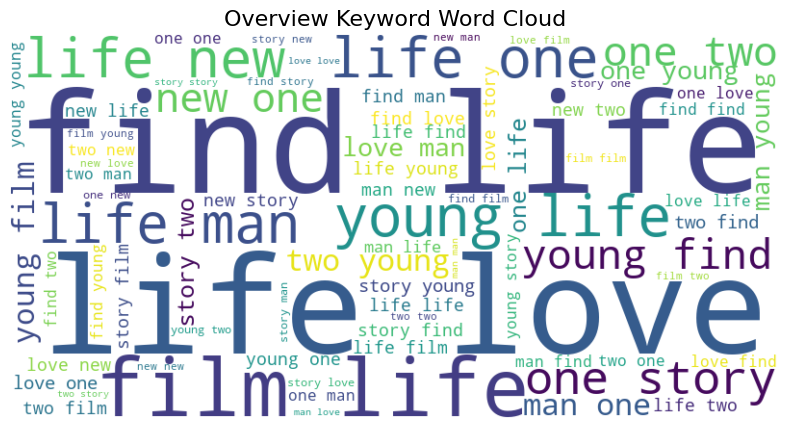

In [36]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

all_keywords = ' '.join(df['overview_keywords'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_keywords)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Overview Keyword Word Cloud", fontsize=16)
plt.show()

In [37]:
df['title_cleaned'] = df['title'].apply(clean_text_advanced)

In [38]:
df[['title_cleaned','title']]

,title_cleaned,title
0,toy story,Toy Story
1,jumanji,Jumanji
2,grumpier old men,Grumpier Old Men
3,waiting exhale,Waiting to Exhale
4,father bride part ii,Father of the Bride Part II
...,...,...
45461,subdue,Subdue
45462,century birthing,Century of Birthing
45463,betrayal,Betrayal
45464,satan triumphant,Satan Triumphant


In [39]:
tfidf_ = TfidfVectorizer(max_features= 20)

tfidf_matrix_ = tfidf_.fit_transform(df['title_cleaned'])
keywords_df_ = pd.DataFrame(tfidf_matrix_.toarray(), columns=tfidf_.get_feature_names_out())
df['title_keywords'] = keywords_df_.apply(lambda x: ', '.join(keywords_df_.columns[x > 0]), axis=1)

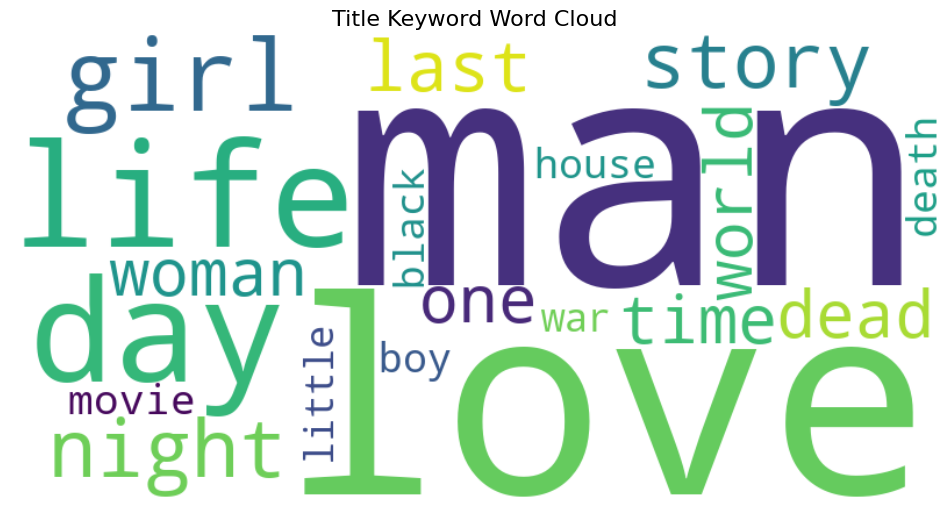

In [40]:
# Combine all keywords into a single string
all_keywords = ' '.join(df['title_keywords'])

# Generate and display the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_keywords)

plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Title Keyword Word Cloud", fontsize=16)
plt.show()

In [41]:
df['tagline_cleaned'] = df['tagline'].apply(clean_text_advanced)

In [42]:
df[['tagline','tagline_cleaned']]

,tagline,tagline_cleaned
0,No Tagline Available,tagline available
1,Roll the dice and unleash the excitement!,roll dice unleash excitement
2,Still Yelling. Still Fighting. Still Ready for...,still yelling still fighting still ready love
3,Friends are the people who let you be yourself...,friend people let never let forget
4,Just When His World Is Back To Normal... He's ...,world back normal he surprise life
...,...,...
45461,Rising and falling between a man and woman,rising falling man woman
45462,No Tagline Available,tagline available
45463,A deadly game of wits.,deadly game wit
45464,No Tagline Available,tagline available


In [43]:
tfidf_ = TfidfVectorizer(max_features= 20)

tfidf_matrix_ = tfidf_.fit_transform(df['tagline_cleaned'])
keywords_df_ = pd.DataFrame(tfidf_matrix_.toarray(), columns=tfidf_.get_feature_names_out())
df['tagline_keywords'] = keywords_df_.apply(lambda x: ', '.join(keywords_df_.columns[x > 0]), axis=1)

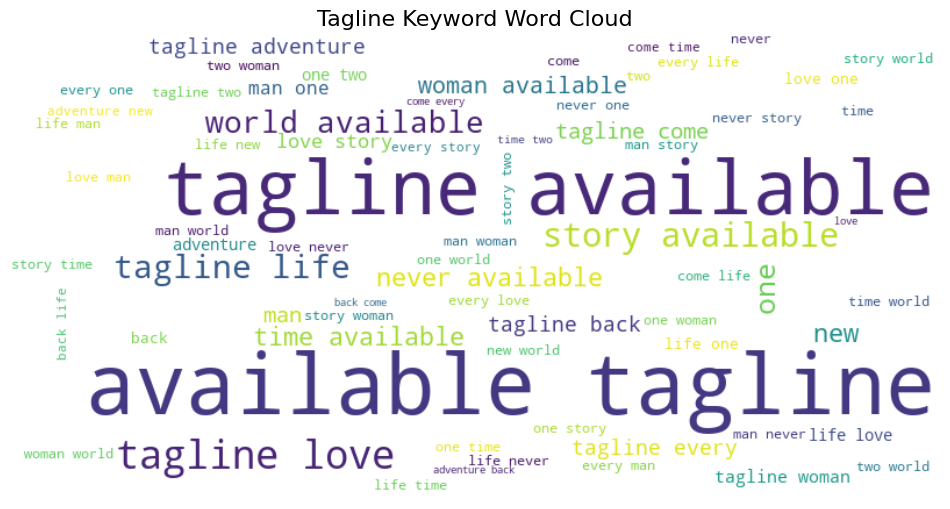

In [44]:
all_keywords = ' '.join(df['tagline_keywords'])

# Generate and display the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_keywords)

plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Tagline Keyword Word Cloud", fontsize=16)
plt.show()

## Result Summary:

The movies are about a young person, either a man or a woman, who goes through the ups and downs of life while looking for love. The story focuses on their personal journey, relationships, and the challenges they face. The movie also explores important themes like time, life, and death, suggesting that the characters might deal with loss and the reality of mortality. It seems to be a mix of romance and deep reflection, showing how people grow, experience love, and face difficult moments in life.

In [43]:
import ast
from collections import Counter

In [45]:
def extract_objects(string):
    try:
        # Convert the string to a list of dictionaries
        objects = ast.literal_eval(string)
        # Extract the 'name' field from each dictionary
        return [object_['name'] for object_ in objects]
    except:
        return []

In [47]:
df['genre_list'] = df['genres'].apply(extract_objects)
df['production_companies_list'] = df['production_companies'].apply(extract_objects)
df['production_countries_list'] = df['production_countries'].apply(extract_objects)
df['spoken_languages_list'] = df['spoken_languages'].apply(extract_objects)

## Univariate Analysis

**Top 10 genres movie distribution**

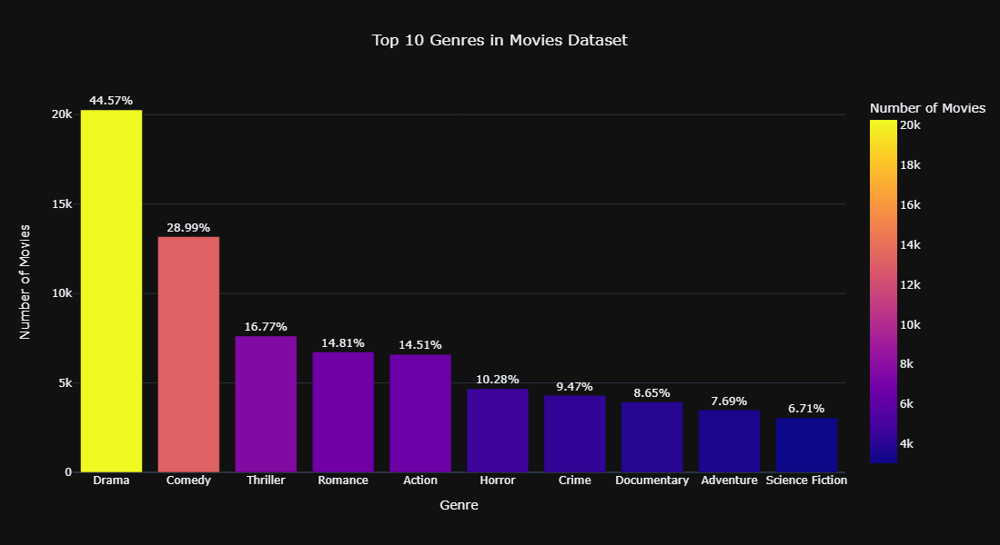

In [51]:
all_genres = [genre for sublist in df['genre_list'] for genre in sublist]

genre_counts = Counter(all_genres)
total_movies = len(df)
genre_df = pd.DataFrame(genre_counts.items(), columns=['Genre', 'Count'])
genre_df['Percentage'] = (genre_df['Count'] / total_movies * 100).round(2)

fig = px.bar(
    genre_df.sort_values(by='Percentage',ascending=False).head(10), 
    x='Genre', 
    y='Count',
    color='Count',
    title='Top 10 Genres in Movies Dataset',
    labels={'Genre': 'Genre', 'Count': 'Number of Movies'},
    text= 'Percentage'
)
fig.update_traces(
                  texttemplate='%{text:.2f}%',
                  textposition='outside'
                 )
fig.update_layout(template = 'plotly_dark',
                  title_x = 0.5,
                  height = 600,
                  width = 800
                 )
fig.show()

- The dominance of Drama (44.57%) and Comedy (28.99%) suggests these genres are the most profitable and reliable for attracting diverse audiences. Thrilling genres like Thriller (16.77%) and Action (14.51%) highlight opportunities in high-energy content that appeals to younger demographics. Romance (14.81%) retains strong market value as a universal theme.

- Family-friendly genres, including Family (6.09%) and Animation (4.26%), provide a steady revenue stream from younger audiences and family-oriented consumers. Niche genres like Fantasy (5.09%) and Crime (9.47%) cater to specific tastes, offering potential for targeted marketing strategies.

- This data indicates that investments in emotionally engaging, high-energy, and family-oriented content are key to maximizing audience reach and profitability.

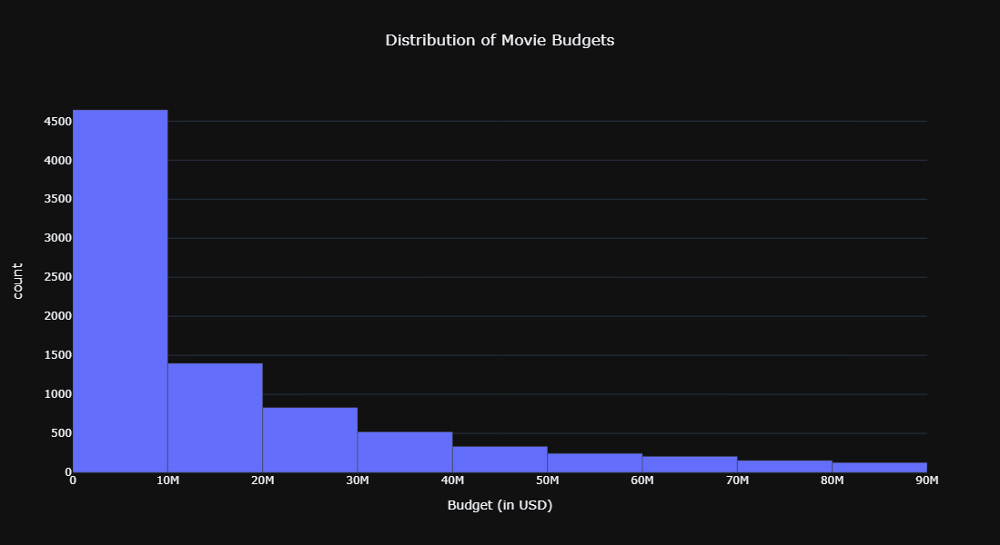

In [54]:
fig = px.histogram(
    df, 
    x='budget', 
    nbins=50,
    title='Distribution of Movie Budgets',
    labels={'budget': 'Budget (in USD)'}
)
fig.update_traces(marker_line_width=0.5)
fig.update_layout(xaxis=dict(range=[0,df['budget'].quantile(0.95)]),
                 template = 'plotly_dark',
                  title_x = 0.5,
                 height =600,
                 width=800)
fig.show()

- The majority of movies (4644) have a budget under `$10M`, indicating a significant focus on low-budget productions, which likely target niche markets or independent audiences. A smaller proportion (1396) falls within the `$10M-$20M` range, showcasing mid-budget films with modest production scales. High-budget films over `$50M` account for fewer movies, but their impact is substantial due to their focus on blockbuster appeal and large-scale marketing.

- Investments in `$20M-$50M` budgets (1678 movies) present opportunities for balancing production quality and risk, appealing to wider audiences without the high stakes of blockbusters. This distribution suggests a strong reliance on low-budget films for volume and strategic allocation to high-budget projects for profitability and brand value

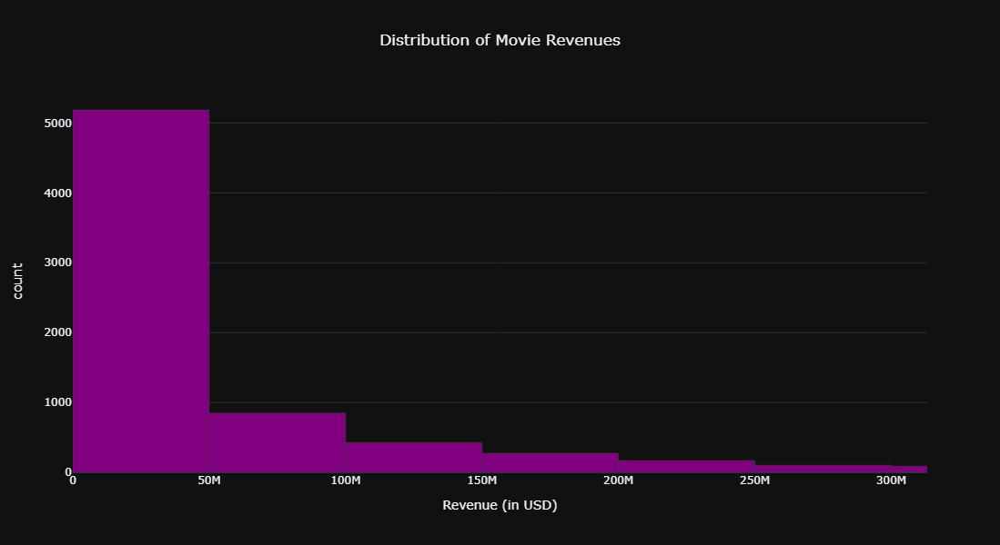

In [57]:
fig = px.histogram(
    df, 
    x='revenue', 
    nbins=100, 
    title='Distribution of Movie Revenues',
    labels={'revenue': 'Revenue (in USD)'}
)
fig.update_traces(marker_color='purple',
                  marker_line_width=0.5)
fig.update_layout(xaxis=dict(range=[0, df['revenue'].quantile(0.95)]),
                  template = 'plotly_dark',
                  title_x = 0.5,
                 height =600,
                 width=800) 
fig.show()


- The revenue distribution reveals that a majority of movies (5187) generate revenues under $50M, indicating that most films operate within a modest revenue range. However, a smaller segment of high-revenue movies drives significant profitability:

  - `$50M–$150M` movies (1274) represent mid-tier performers with potential for strong returns on investment.
  - `$150M–$350M` movies (630) reflect premium, blockbuster-level success, though they are fewer in number.

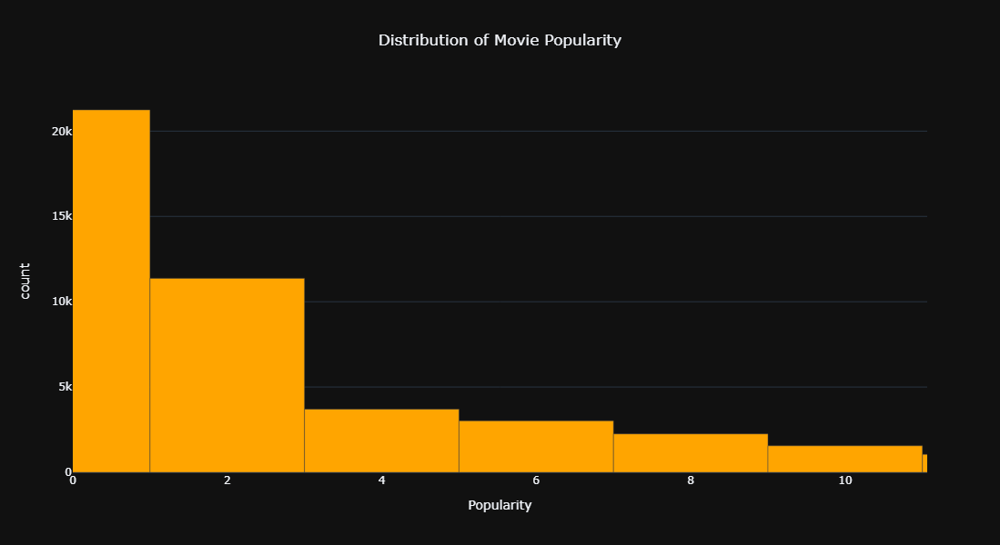

In [60]:
df['popularity'] = pd.to_numeric(df['popularity'],errors='coerce')
fig = px.histogram(
    df, 
    x='popularity',
    nbins= 400,
    title='Distribution of Movie Popularity',
    labels={'popularity': 'Popularity'}
)
fig.update_traces(marker_color='orange',
                   marker_line_width=0.5)
fig.update_layout(xaxis=dict(range=[0, df['popularity'].quantile(0.95)]),
                 template = 'plotly_dark',
                  title_x = 0.5,
                 height =600,
                 width=800)
fig.show()

Most movies (21.243k) fall into the low popularity range (1–1), reflecting limited reach. Moderately popular films (1–3, 11.371k) offer potential for growth with targeted promotion. Mid-tier movies (3–7, 6717) show solid engagement, while highly popular films (7–11, 3809) drive blockbuster success and significant returns.

Focusing on promoting mid-tier films and capitalizing on high-engagement movies can maximize profitability and market impact.

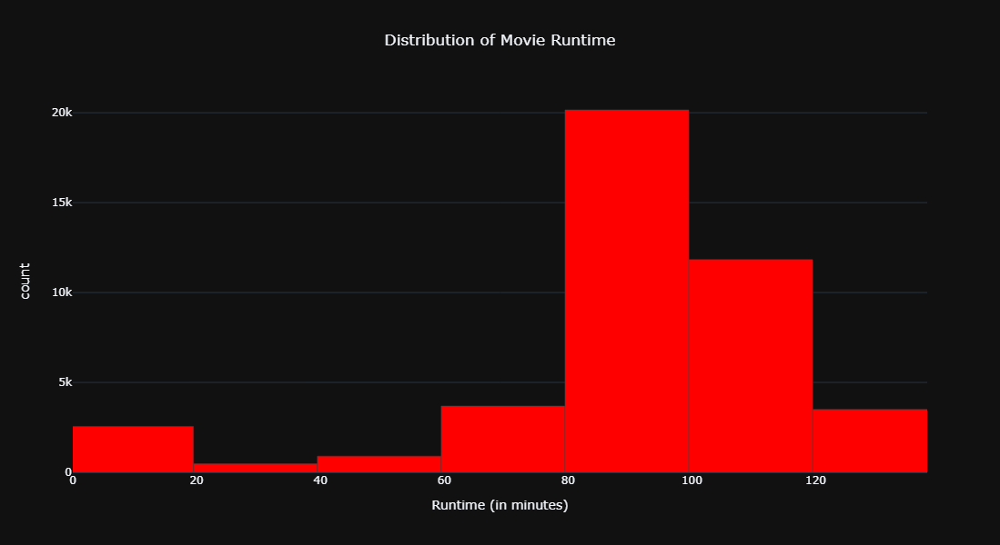

In [63]:
fig = px.histogram(
    df, 
    x='runtime', 
    nbins=100, 
    title='Distribution of Movie Runtime',
    labels={'runtime': 'Runtime (in minutes)'}
)
fig.update_traces(marker_color='red',
                 marker_line_width=0.5)
fig.update_layout(xaxis=dict(range=[0, df['runtime'].quantile(0.95)]),
                 template = 'plotly_dark',
                 title_x = 0.5,
                 height =600,
                 width=800)
fig.show()


Most movies (71%) fall within 80–119 minutes, the standard runtime for broad audience appeal and maximum profitability. Shorter films (0–79 minutes, 15%) cater to niche audiences, while longer films (120–139 minutes, 8%) suit epic storytelling but require strategic planning due to fewer daily screenings. Prioritizing standard-length films ensures optimal engagement and revenue.

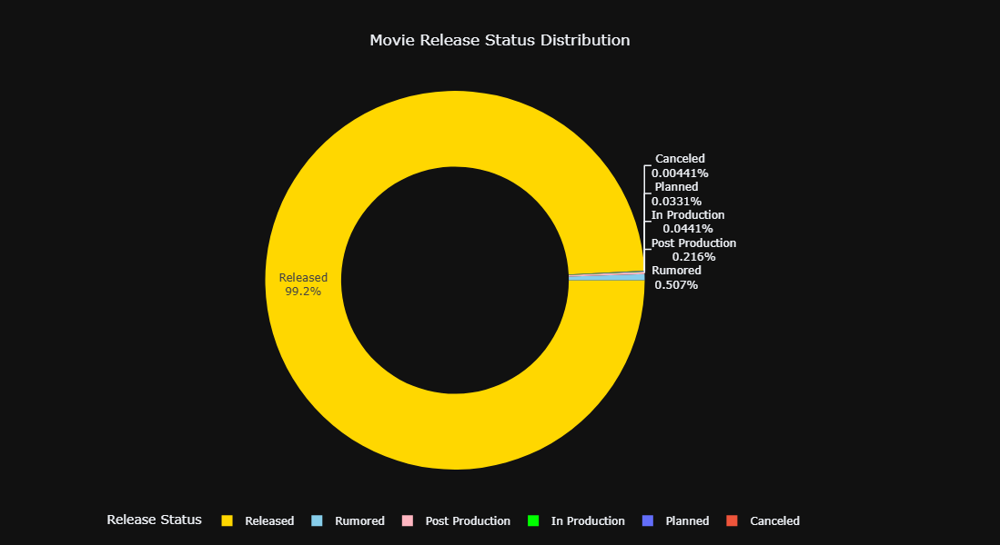

In [66]:
status_counts = df['status'].value_counts()

fig = px.pie(
    values=status_counts.values, 
    names=status_counts.index, 
    title='Movie Release Status Distribution',
    hole=0.6 
)

fig.update_traces(
    textinfo='percent+label',
    marker=dict(colors=['gold', 'skyblue', 'lightpink', 'lime']),
    rotation=90,
    hovertemplate='%{label}: %{value} movies (%{percent})'
)

fig.update_layout(
    template='plotly_dark',
    title_x = 0.5,
    height=600,
    width=800,
    legend=dict(
        title="Release Status",
        orientation="h",
        x=0.5,
        xanchor='center',
        y=-0.1
    )
)

fig.show()


In [68]:
### Top production Countries

all_countries = [country for sublist in df['production_countries_list'] for country in sublist]

country_counts = Counter(all_countries)
country_count_df = pd.DataFrame(country_counts.items(), columns=['Country', 'Movie_Count']).sort_values(by='Movie_Count', ascending=False)
country_count_df.head(10)

,Country,Movie_Count
0,United States of America,21153
2,United Kingdom,4094
3,France,3940
1,Germany,2254
4,Italy,2169
9,Canada,1765
12,Japan,1648
5,Spain,964
20,Russia,912
40,India,828


- **United States of America** produce maximum number of movies
- We have to visualize another top most production coutries.

In [71]:
countries = country_count_df[1:]

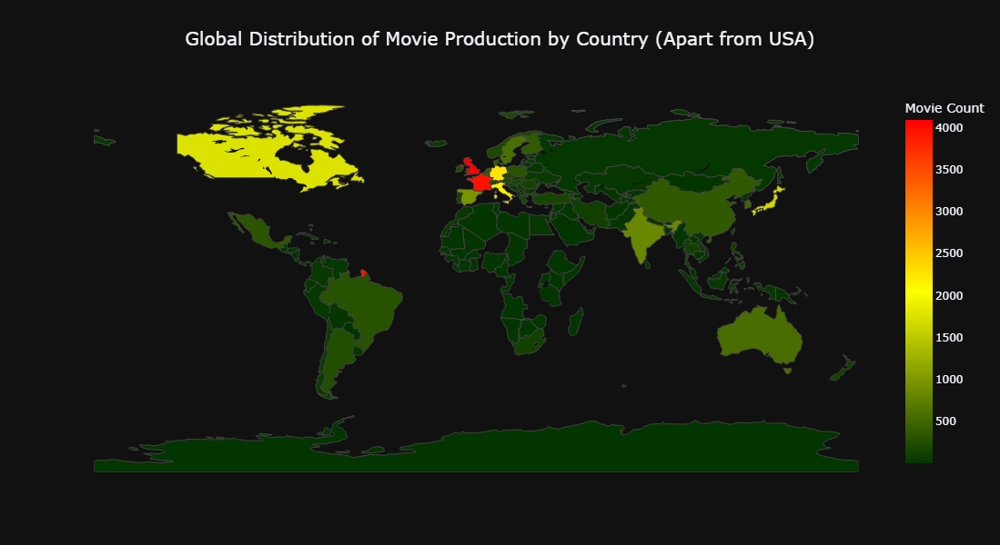

In [73]:
custom_color_scale = [
    (0.0, "rgb(3, 53, 0)"),
    (0.5, "rgb(255, 255, 0)"),
    (1.0, "rgb(255, 0, 0)")
]

fig = px.choropleth(
    countries,
    locations='Country',
    locationmode='country names',
    color='Movie_Count',
    title='Global Distribution of Movie Production by Country (Apart from USA)',
    color_continuous_scale= custom_color_scale,
    labels={'Movie_Count': 'Number of Movies'}
)

fig.update_layout(
    template='plotly_dark',
     height = 600,
    width = 800,
    coloraxis_colorbar=dict(title="Movie Count"),
    geo=dict(showframe=False, 
             showcoastlines=False,
              ),
    title=dict(font=dict(size=20), x=0.5)
)

fig.show()

The **United States of America** dominates the global movie industry, producing over 21,000 movies, making it the leader by a significant margin. Other notable contributors include the **United Kingdom** and **France**, with approximately 4,094 and 3,940 movies, respectively.

**Germany** and **Italy** follow as mid-tier contributors, with 2,254 and 2,169 movies, respectively. Countries like **Canada** (1,765 movies), **Japan** (1,648 movies), and **Russia** (912 movies) also play notable roles in movie production. While **India** appears lower on the list with 828 movies, its contribution is still noteworthy, reflecting its vibrant film industry.

This distribution highlights the dominance of Western countries in the movie industry, with emerging contributions from other regions.

In [76]:
## Top Production Companies

company_count = Counter([company for sublist in df['production_companies_list'] for company in sublist])
company_count_df = pd.DataFrame(company_count.items(), columns=['Company', 'Movie_Count']).sort_values(by='Movie_Count', ascending=False)

top_companies = company_count_df.head(15)

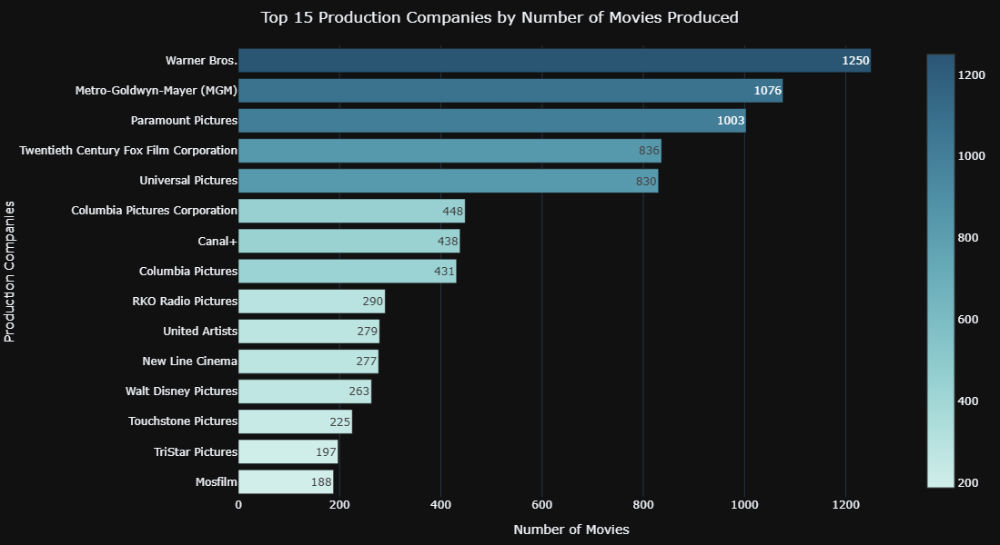

In [78]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=top_companies['Movie_Count'],  
    y=top_companies['Company'],   
    orientation='h',             
    marker=dict(
        color=top_companies['Movie_Count'], 
        colorscale='Teal',             
        showscale=True                
    ),
    text=top_companies['Movie_Count'],
    textposition='inside',
    texttemplate='%{text}', 
    hovertemplate=(
        "<b>Company:</b> %{y}<br>"
        "<b>Movies Produced:</b> %{x}<extra></extra>"
    )
))

fig.update_layout(
    title="Top 15 Production Companies by Number of Movies Produced",
    title_x = 0.5,
    xaxis=dict(
        title="Number of Movies",
        showgrid=True,
        zeroline=False
    ),
    yaxis=dict(
        title="Production Companies",
        categoryorder='total ascending'
    ),
    template='plotly_dark',
    height=600,
    width=800,
    margin=dict(t=50, b=50, l=100, r=50),
    coloraxis_colorbar=dict(title="Movie Count"),
    showlegend=False
)

fig.show()

The analysis highlights leading production companies, with **Warner Bros. (1,250 movies)** at the top, followed by **Metro-Goldwyn-Mayer (MGM) (1,076)** and **Paramount Pictures (1,003)**. Major contributors like **Twentieth Century Fox (836)** and **Universal Pictures (830)** showcase their global influence. International players like **Mosfilm (188)** and **Canal+ (438)** add diversity, emphasizing the global reach of the industry.

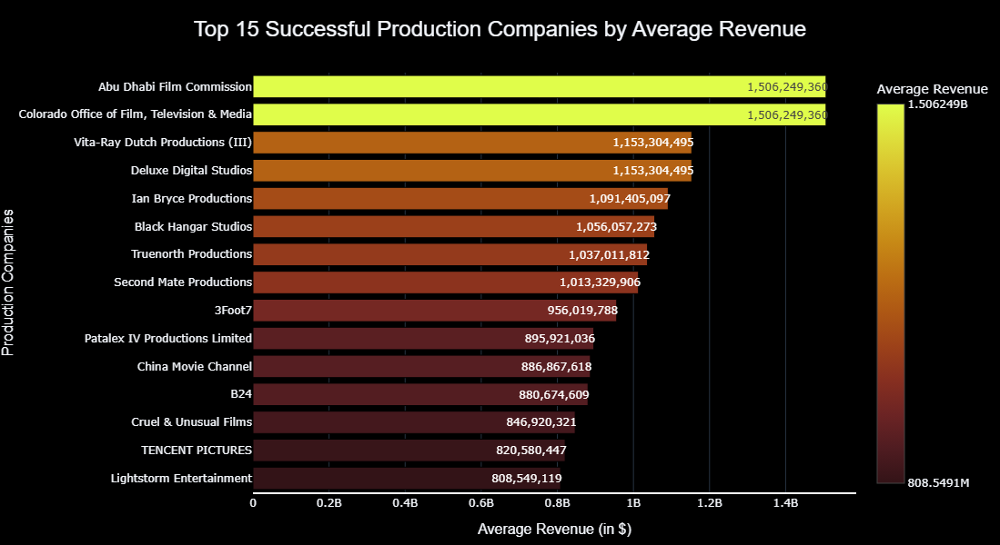

In [81]:
company_revenue = df.explode('production_companies_list').groupby('production_companies_list')['revenue'].mean().reset_index()
company_revenue_sorted = company_revenue.sort_values(by='revenue', ascending=False).head(15)

fig = go.Figure()

fig.add_trace(go.Bar(
    x=company_revenue_sorted['revenue'],  
    y=company_revenue_sorted['production_companies_list'],   
    orientation='h',             
    marker=dict(
        color=company_revenue_sorted['revenue'], 
        colorscale='solar',
        showscale=True,        
        colorbar=dict(title="Average Revenue", 
                      tickvals=[company_revenue_sorted['revenue'].min(), 
                                company_revenue_sorted['revenue'].max()]),
        line=dict(color='black', width=1) 
    ),
    text=company_revenue_sorted['revenue'],
    textposition='inside',
    texttemplate='%{text:,.0f}',
    hovertemplate=(
        "<b>Company:</b> %{y}<br>"
        "<b>Average Revenue:</b> $%{x}<br>"
        "<b>Movies Produced:</b> %{customdata}<extra></extra>"
    ),
    customdata=company_count_df['Movie_Count']
))

fig.update_layout(
    title="Top 15 Successful Production Companies by Average Revenue",
    title_x=0.5,
    title_font=dict(size=24, family='Arial, sans-serif'),
    xaxis=dict(
        title="Average Revenue (in $)",
        title_font=dict(size=16, family='Arial, sans-serif'),
        showgrid=True,
        zeroline=False,
        tickfont=dict(size=12),
        showline=True,
        linecolor='white',
        linewidth=2
    ),
    yaxis=dict(
        title="Production Companies",
        title_font=dict(size=16, family='Arial, sans-serif'),
        categoryorder='total ascending',
        tickfont=dict(size=12),
        showline=False
    ),
    template='plotly_dark',
    height=600,
    width = 800,
    margin=dict(t=80, b=50, l=150, r=50),
    coloraxis_colorbar=dict(title="Average Revenue", 
                            tickvals=[company_revenue_sorted['revenue'].min(), 
                                      company_revenue_sorted['revenue'].max()]),
    showlegend=False,
    plot_bgcolor='black',
    paper_bgcolor='black'

)

fig.show()

- The highest average revenue is approximately $1.5$ billion for **Colorado Office of Film, Television & Media** and **Abu Dhabi Film Commission**.
- This list includes companies in various industries, including media production, digital studios, and entertainment ventures.
- The lowest average revenue in the top 15 is around $808.5$ million, which still reflects significant industry success.
- These companies have varying levels of involvement in film production, with some being high-profile like **Lightstorm Entertainment (which produced the Avatar series)** and others being more specialized studios such as **Black Hangar Studios** and **Second Mate Productions**.


In [84]:
## Most successful movie franchise
df_fran = df[df['belongs_to_collection'].notnull()]
df_fran['belongs_to_collection'] = df_fran['belongs_to_collection'].apply(ast.literal_eval).apply(lambda x: x['name'] if isinstance(x, dict) else np.nan)
df_fran = df_fran[df_fran['belongs_to_collection'].notnull()]

In [86]:
franchise_data = df_fran[['belongs_to_collection', 'revenue', 'runtime']]

franchise_summary = franchise_data.groupby('belongs_to_collection').agg(
    total_revenue=('revenue', 'sum'),
    avg_revenue = ('revenue', 'mean'),
    total_runtime=('runtime', 'sum'),
    num_movies_runtime = ('runtime', 'count'),
    num_movies=('revenue', 'count')
).reset_index()

highest_grossing_franchises = franchise_summary.sort_values(by='total_revenue', ascending=False).head(15)
successful_movie_franchises = franchise_summary.sort_values(by='avg_revenue', ascending=False).head(15)
longest_running_franchises = franchise_summary.sort_values(by='total_runtime', ascending=False).head(15)

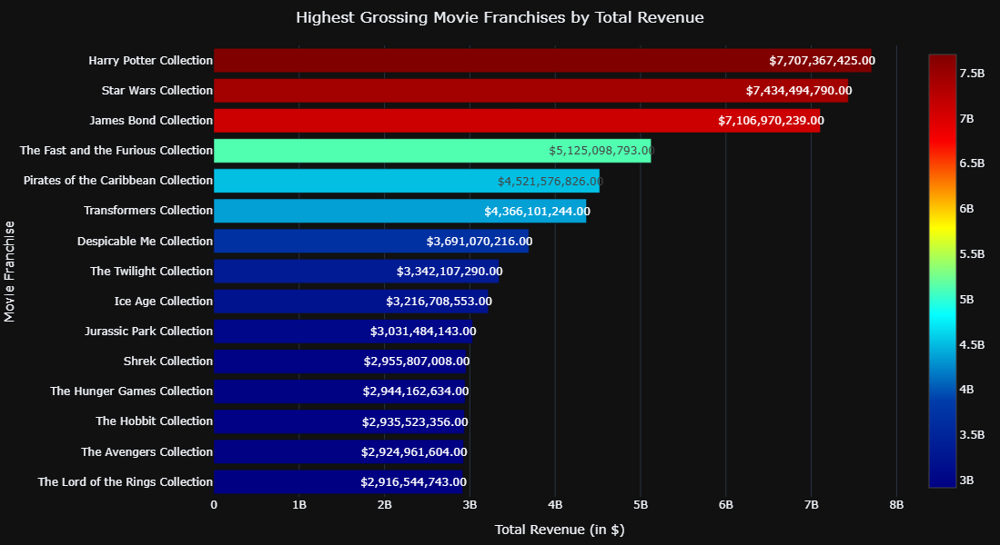

In [88]:
fig_grossing = go.Figure()

fig_grossing.add_trace(go.Bar(
    x=highest_grossing_franchises['total_revenue'],
    y=highest_grossing_franchises['belongs_to_collection'],
    orientation='h',
    marker=dict(
        color=highest_grossing_franchises['total_revenue'],
        colorscale='Jet',
        showscale=True
    ),
    text=highest_grossing_franchises['total_revenue'].apply(lambda x: f"${x:,.2f}"),
    textposition='inside',
    hovertemplate=(
        "<b>Franchise:</b> %{y}<br>"
        "<b>Total Revenue:</b> $%{x}<br>"
        "<b>Number of Movies:</b> %{customdata[0]}<extra></extra>"
    ),
    customdata=highest_grossing_franchises[['num_movies']] 
))

fig_grossing.update_layout(
    title="Highest Grossing Movie Franchises by Total Revenue",
    title_x=0.5,
    xaxis=dict(
        title="Total Revenue (in $)",
        showgrid=True,
        zeroline=False
    ),
    yaxis=dict(
        title="Movie Franchise",
        categoryorder='total ascending'
    ),
    template='plotly_dark',
    height=600,
    width=800,
    margin=dict(t=50, b=50, l=150, r=50),
    coloraxis_colorbar=dict(title="Total Revenue"),
    showlegend=False
)
fig_grossing.show()

- The **Harry Potter** and **Star Wars** collections are significantly ahead of other franchises in total revenue, each crossing the $7 billion mark.
- Franchises like **James Bond**, **The Fast and the Furious**, and **Pirates of the Caribbean** have strong earnings, with a relatively larger number of movies in their collections.
- **James Bond** has the most movies among the top franchises (26 movies).
- Some of the top franchises, such as **The Avengers** and **The Hobbit**, have fewer movies (2–3 movies), yet still maintain high revenue totals.

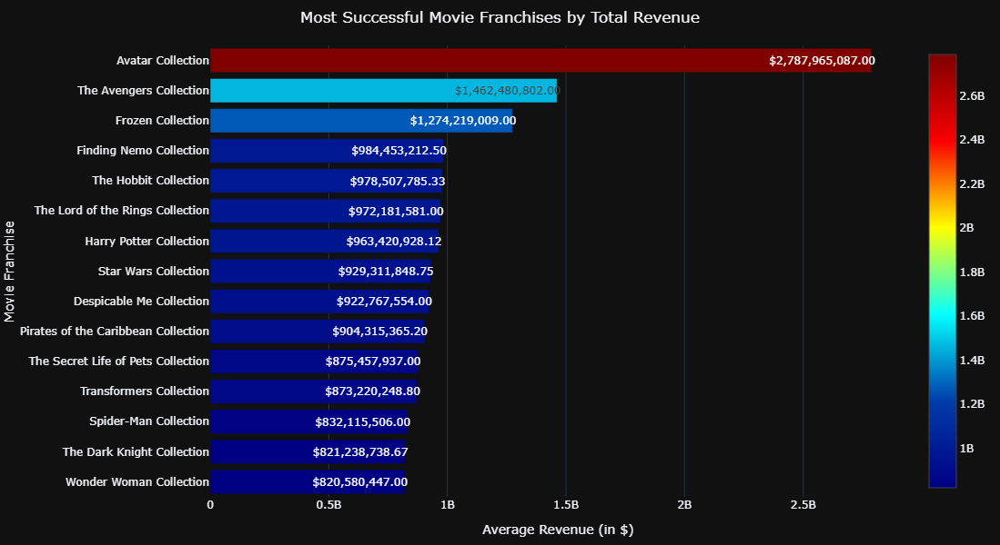

In [91]:
fig_successful  = go.Figure()

fig_successful.add_trace(go.Bar(
    x=successful_movie_franchises['avg_revenue'],
    y=successful_movie_franchises['belongs_to_collection'],
    orientation='h',
    marker=dict(
        color=successful_movie_franchises['avg_revenue'],
        colorscale='Jet',
        showscale=True
    ),
    text=successful_movie_franchises['avg_revenue'].apply(lambda x: f"${x:,.2f}"),
    textposition='inside',
    hovertemplate=(
        "<b>Franchise:</b> %{y}<br>"
        "<b>Total Revenue:</b> $%{x}<br>"
        "<b>Number of Movies:</b> %{customdata[0]}<extra></extra>"
    ),
    customdata=successful_movie_franchises[['num_movies']] 
))

fig_successful.update_layout(
    title="Most Successful Movie Franchises by Total Revenue",
    title_x=0.5,
    xaxis=dict(
        title="Average Revenue (in $)",
        showgrid=True,
        zeroline=False
    ),
    yaxis=dict(
        title="Movie Franchise",
        categoryorder='total ascending'
    ),
    template='plotly_dark',
    height=600,
    width=800,
    margin=dict(t=50, b=50, l=150, r=50),
    coloraxis_colorbar=dict(title="Average Revenue"),
    showlegend=False
)
fig_successful.show()


The **Avatar** Collection leads with an average revenue of 2.79 billion from a single movie, followed by **The Avengers** with 1.46 billion across two movies and **Frozen** with 1.27 billion from one movie. Other notable franchises include **Finding Nemo** with 984 million from two movies, **The Hobbit** with 978 million from three movies, and **The Lord of the Rings** with $972 million from three films. These franchises stand out for their high average revenues, especially those with fewer movies.

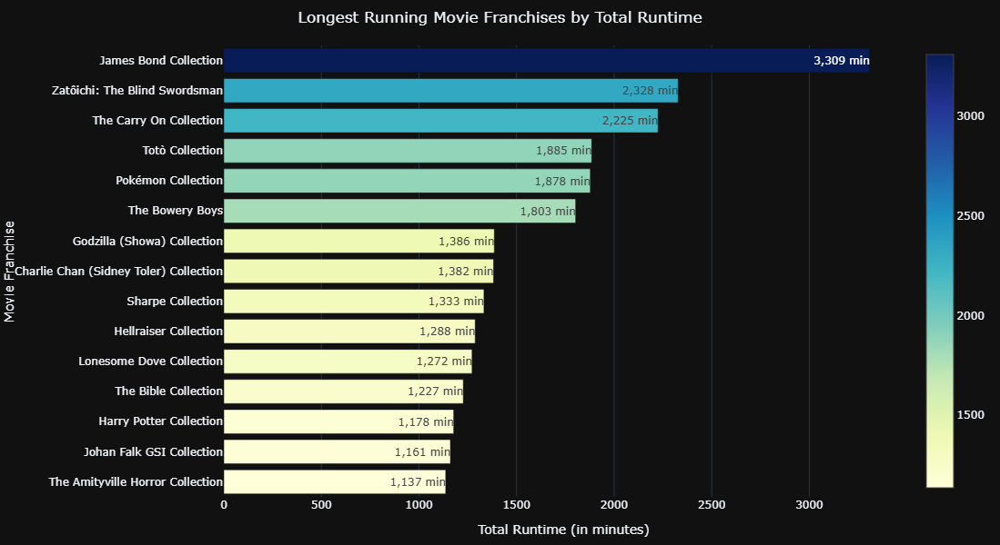

In [94]:
fig_runtime = go.Figure()

fig_runtime.add_trace(go.Bar(
    x=longest_running_franchises['total_runtime'],
    y=longest_running_franchises['belongs_to_collection'],
    orientation='h',
    marker=dict(
        color=longest_running_franchises['total_runtime'],
        colorscale='YlGnBu',
        showscale=True
    ),
    text=longest_running_franchises['total_runtime'].apply(lambda x: f"{x:,.0f} min"),
    textposition='inside',
    hovertemplate=(
        "<b>Franchise:</b> %{y}<br>"
        "<b>Total Runtime:</b> %{x:,.0f} min<br>"
        "<b>Number of Movies:</b> %{customdata[0]}<extra></extra>"
    ),
    customdata=longest_running_franchises[['num_movies_runtime']]
))

fig_runtime.update_layout(
    title="Longest Running Movie Franchises by Total Runtime",
    title_x=0.5,
    xaxis=dict(
        title="Total Runtime (in minutes)",
        showgrid=True,
        zeroline=False
    ),
    yaxis=dict(
        title="Movie Franchise",
        categoryorder='total ascending'
    ),
    template='plotly_dark',
    height=600,
    width=800,
    margin=dict(t=50, b=50, l=150, r=50),
    coloraxis_colorbar=dict(title="Total Runtime (min)"),
    showlegend=False
)
fig_runtime.show()

The **James Bond Collection** is the longest-running franchise with 26 movies and a total runtime of 3,309 minutes, earning 7.11 billion. Other long-running franchises include **Zatôichi: The Blind Swordsman** and **The Carry On Collection**, each with 26 and 25 movies, respectively, though they don't have recorded revenue. **Pokémon** has 22 movies with a runtime of 1,878 minutes, and its average revenue per movie is $63.48 million.

In [97]:
## Most popular movies by popularity score

top_movies = df[['title', 'popularity','Year']].sort_values(by='popularity', ascending=False).head(15)

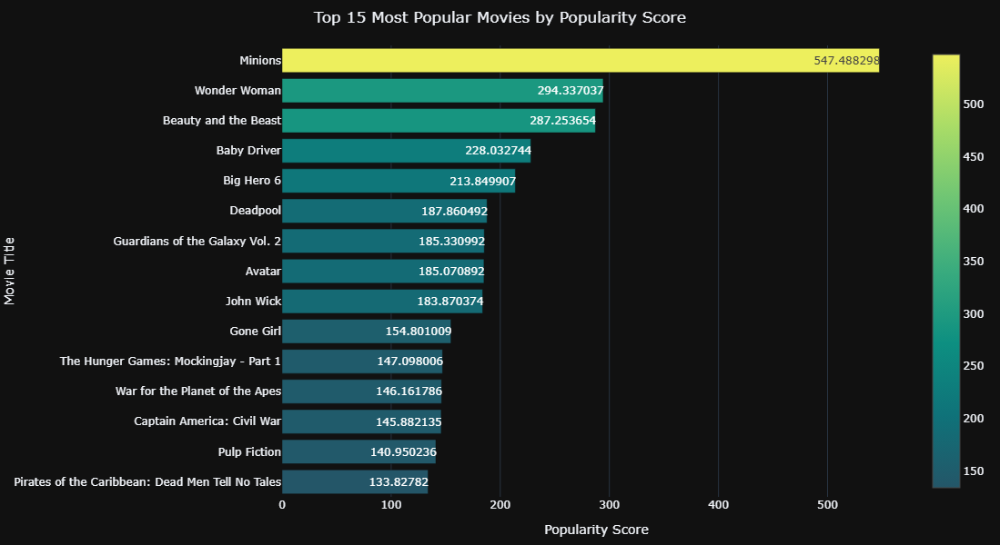

In [99]:
fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=top_movies['popularity'],
        y=top_movies['title'],
        orientation='h',
        marker=dict(
            color=top_movies['popularity'],
            colorscale='aggrnyl',
            showscale=True
        ),
        text=top_movies['popularity'],
        textposition='inside',
        hovertemplate="<b>Movie:</b> %{y}<br>"
                      "<b>Popularity:</b> %{x}<br>"
                      "<b>Release Year:</b> %{customdata}<extra></extra>",
        customdata=top_movies[['Year']]
    ),
    
)
fig.update_layout(
    title="Top 15 Most Popular Movies by Popularity Score",
    title_x=0.5,
    xaxis=dict(
        title="Popularity Score",
        showgrid=True,
        zeroline=False
    ),
    yaxis=dict(
        title="Movie Title",
        categoryorder='total ascending'
    ),
    template='plotly_dark',
    height=600,
    width = 800,
    margin=dict(t=50, b=50, l=100, r=50),
    coloraxis_colorbar=dict(title="Popularity Score"),
    showlegend=False
)

fig.show()

The top 15 most popular movies based on their popularity scores are led by **Minions (2015)**, with a score of 547.49, followed by **Wonder Woman (2017)** and **Beauty and the Beast (2017)**, with popularity scores of 294.34 and 287.25, respectively. Other notable films in the list include **Baby Driver (2017)**, **Big Hero 6 (2014)**, **and Deadpool (2016)**. The list showcases movies from various years, with a concentration of successful releases from 2014 to 2017. The range of genres and franchises, such as **Avatar (2009)** and **Guardians of the Galaxy Vol. 2 (2017)**, also highlights the global appeal and strong box-office performances of these films.

In [102]:
##Most voted Movies
top_voted_movies = df[['title', 'vote_count','Year']].sort_values(by='vote_count', ascending=False).head(15)

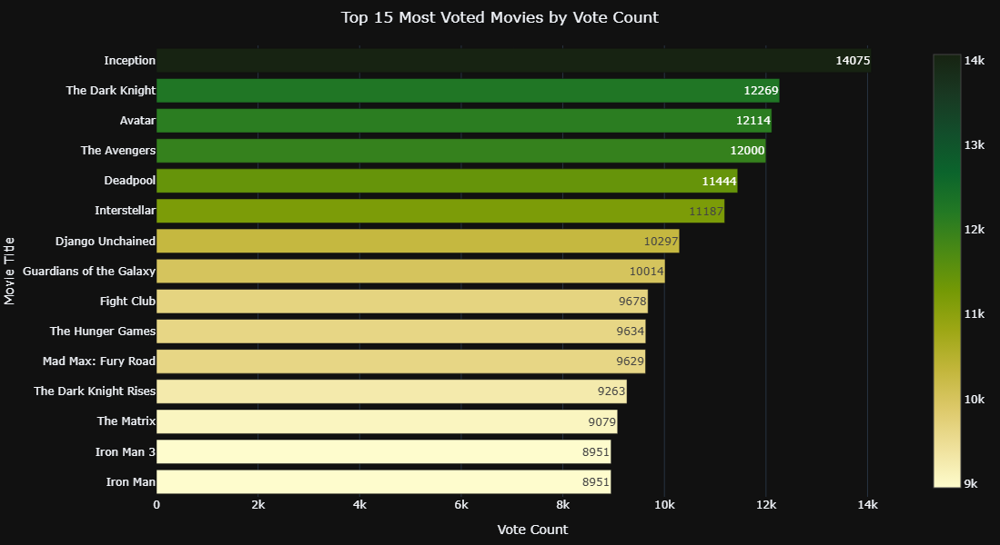

In [104]:
fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=top_voted_movies['vote_count'],
        y=top_voted_movies['title'],
        orientation='h',
        marker=dict(
            color=top_voted_movies['vote_count'],
            colorscale='speed',
            showscale=True
        ),
        text=top_voted_movies['vote_count'],
        textposition='inside',
        hovertemplate="<b>Movie:</b> %{y}<br>"
                      "<b>Vote Count:</b> %{x}<br>"
                      "<b>Release Year:</b> %{customdata}<extra></extra>",
        customdata=top_voted_movies[['Year']]
    )
)
fig.update_layout(
    title="Top 15 Most Voted Movies by Vote Count",
    title_x=0.5,
    xaxis=dict(
        title="Vote Count",
        showgrid=True,
        zeroline=False
    ),
    yaxis=dict(
        title="Movie Title",
        categoryorder='total ascending'
    ),
    template='plotly_dark',
    height=600,
    width = 800,
    margin=dict(t=50, b=50, l=100, r=50),
    coloraxis_colorbar=dict(title="Vote Count"),
    showlegend=False
)

fig.show()

The top voted movies, based on the number of votes, are dominated by iconic films from various genres. **Inception (2010)** leads with the highest vote count of 14,075, followed closely by **The Dark Knight (2008)** with 12,269 votes and **Avatar (2009)** with 12,114 votes. Other notable entries in the top 15 include **The Avengers (2012)**, **Deadpool (2016)**, and **Interstellar (2014)**, all showcasing a strong audience engagement. Classic action films like **The Dark Knight Rises (2012)**, **The Matrix (1999)**, and **Iron Man (2008)** further solidify the lasting appeal of superhero and action-packed franchises. The majority of these films were released in the late 2000s to mid-2010s, with many securing high fan participation across multiple years.

In [107]:
## Succesful release days and month

df['release_date'] = pd.to_datetime(df['release_date'])

df['weekday'] = df['release_date'].dt.day_name()
df['month'] = df['release_date'].dt.month_name()

In [109]:
weekday_revenue = df.groupby('weekday')['revenue'].sum().sort_values(ascending=False)
month_revenue = df.groupby('month')['revenue'].sum().sort_values(ascending=False)

weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

weekday_revenue = weekday_revenue[weekday_order]
month_revenue = month_revenue[month_order]

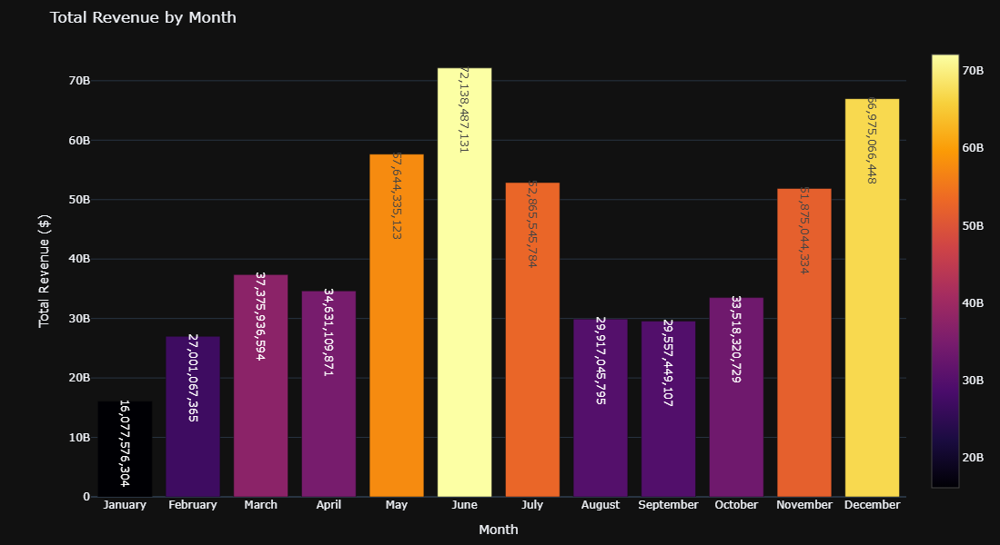

In [111]:
# Create plot for months
fig_month = go.Figure()

fig_month.add_trace(go.Bar(
    x=month_revenue.index, 
    y=month_revenue.values,
    marker=dict(
        color=month_revenue.values,
        colorscale='Inferno',
        showscale=True
    ),
    text=month_revenue.values,
    textposition='inside',
    texttemplate='%{text:,.0f}',
    hovertemplate="<b>Month:</b> %{x}<br><b>Total Revenue:</b> $%{y}<extra></extra>"
))

fig_month.update_layout(
    title="Total Revenue by Month",
    xaxis_title="Month",
    yaxis_title="Total Revenue ($)",
    template="plotly_dark",
    height=600,
    width=800,
    showlegend=False,
    margin=dict(t=50, b=50, l=100, r=50)
)

fig_month.show()

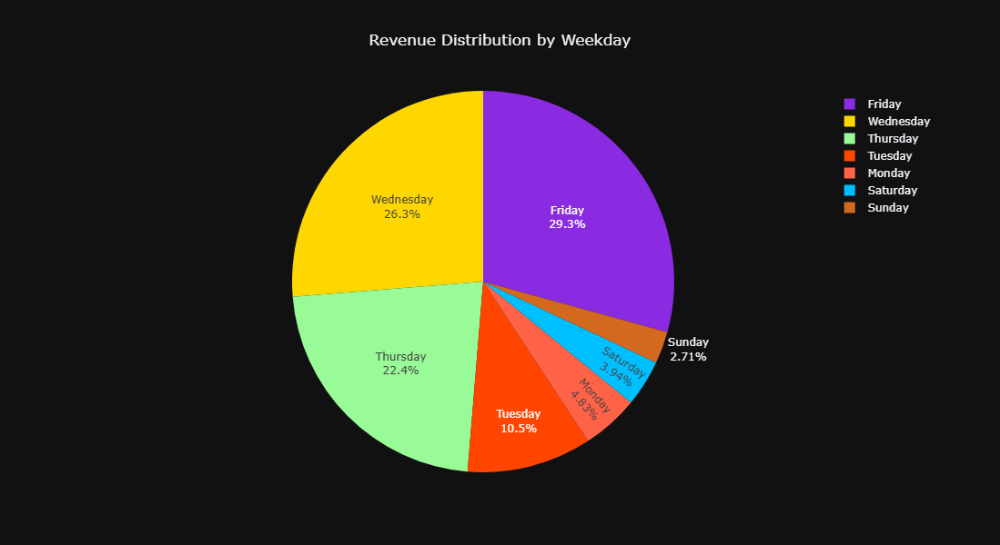

In [113]:
# Pie chart for weekdays (proportion of total revenue)
fig_weekday_pie = go.Figure()

fig_weekday_pie.add_trace(go.Pie(
    labels=weekday_revenue.index,
    values=weekday_revenue.values,
    hoverinfo="label+percent+value",
    textinfo="label+percent",
    marker=dict(
        colors=['#FF6347', '#FF4500', '#FFD700', '#98FB98', '#8A2BE2', '#00BFFF', '#D2691E']
    )
))

fig_weekday_pie.update_layout(
    title="Revenue Distribution by Weekday",
    title_x = 0.5,
    height = 600,
    width = 800,
    template="plotly_dark",
    showlegend=True
)

fig_weekday_pie.show()


- **Weekdays:** Friday is the most profitable day for movie releases, generating 149.2 billion in total revenue, followed by Wednesday with 133.8 billion and Thursday with $114.3 billion. These days stand out as optimal for maximizing box office success.

- **Months:** June emerges as the most successful month for releases, with 72.1 billion in total revenue, followed by December at 66.9 billion and May at $57.6 billion. Summer and holiday seasons are clearly lucrative periods for movie releases.

- **Recommendation:** To maximize box office revenue, consider scheduling movie releases on Fridays during June, December, or May.

In [116]:
## Most popular language movies

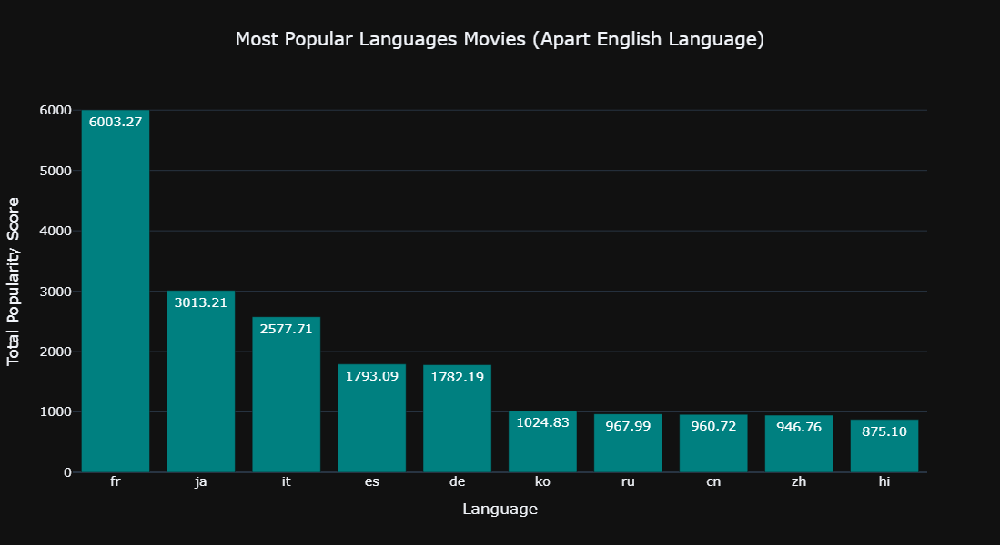

In [118]:
language_popularity = df.groupby('original_language')['popularity'].sum().sort_values(ascending=False)
language_popularity = language_popularity[1:].head(10)

fig = go.Figure()

fig.add_trace(go.Bar(
    x=language_popularity.index,
    y=language_popularity.values,
    marker=dict(color='teal'),
    text=[f"{pop:.2f}" for pop in language_popularity.values],
    textposition='auto'
))

fig.update_layout(
    title="Most Popular Languages Movies (Apart English Language)",
    title_x = 0.5,
    xaxis_title="Language",
    yaxis_title="Total Popularity Score",
    template="plotly_dark",
    font=dict(size=14),
    hoverlabel=dict(bgcolor="white", font_size=12, font_family="Rockwell"),
    height=600,
    width = 800
)

fig.show()

The analysis reveals that movies in **English** dominate the market with a total score of 108,688, significantly surpassing other languages. **French** and **Japanese** movies follow as the second and third most prevalent with scores of 6,003 and 3,013, respectively. Other notable languages include Italian (2,578), Spanish (1,793), German (1,782), and Korean (1,025). Russian, Chinese, and Mandarin films also have moderate representation with scores near 960. This highlights the global dominance of English-language films, with French and Japanese showing notable regional appeal.

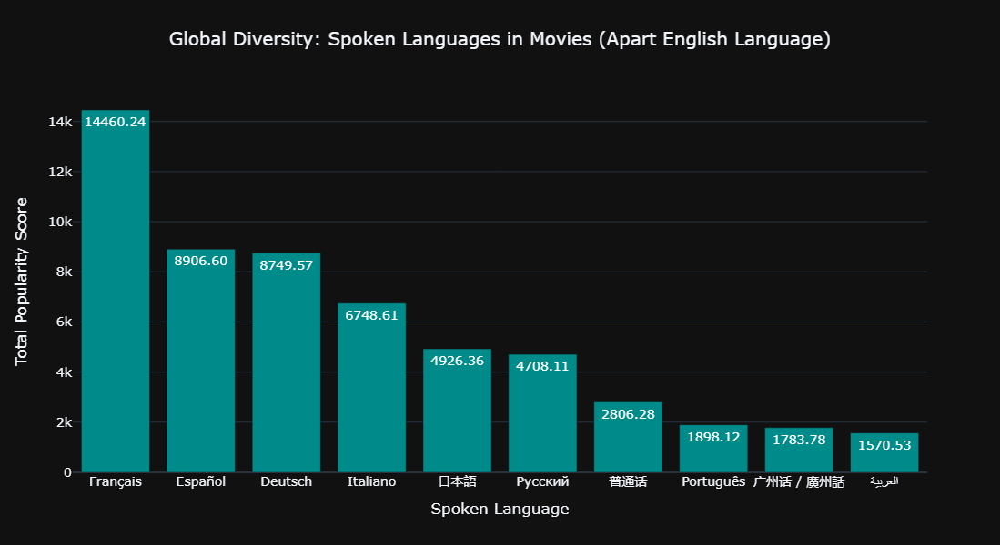

In [121]:
df_exploded = df.explode('spoken_languages_list')

spoken_language_popularity = df_exploded.groupby('spoken_languages_list')['popularity'].sum().sort_values(ascending=False)
spoken_language_popularity = spoken_language_popularity[1:].head(10)

fig = go.Figure()

fig.add_trace(go.Bar(
    x=spoken_language_popularity.index,
    y=spoken_language_popularity.values,
    marker=dict(color='darkcyan'),
    text=[f"{pop:.2f}" for pop in spoken_language_popularity.values],
    textposition='auto'
))

fig.update_layout(
    title="Global Diversity: Spoken Languages in Movies (Apart English Language)",
    title_x = 0.5,
    xaxis_title="Spoken Language",
    yaxis_title="Total Popularity Score",
    template="plotly_dark",
    font=dict(size=14),
    hoverlabel=dict(bgcolor="white", font_size=12, font_family="Rockwell"),
    height=600,
    width = 800
)

fig.show()

English leads as the most spoken language in movies with a popularity score of 110,321, followed by French (14,460) and Spanish (8,906). Other notable languages include German, Italian, Japanese, Russian, Mandarin, Portuguese, and Cantonese, showcasing global cinematic diversity.

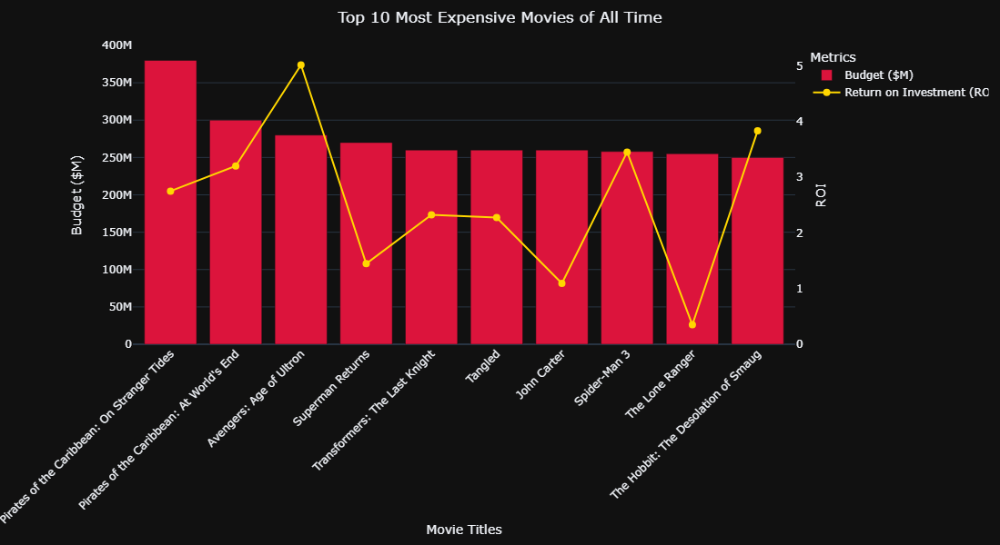

In [124]:
df_top = df.sort_values(by="budget", ascending=False).head(10)

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=df_top["title"],
        y=df_top["budget"],
        name="Budget ($M)",
        marker_color="crimson",
        hovertemplate="<b>%{x}</b><br>Budget: $%{y}M<extra></extra>",
    )
)

fig.add_trace(
    go.Scatter(
        x=df_top["title"],
        y=df_top["return"],
        name="Return on Investment (ROI)",
        mode="lines+markers",
        marker=dict(size=8, color="gold"),
        line=dict(width=2),
        yaxis="y2",
        hovertemplate="<b>%{x}</b><br>ROI: %{y}<extra></extra>",
    )
)

fig.update_layout(
    title="Top 10 Most Expensive Movies of All Time",
    title_x = 0.5,
    template="plotly_dark",
    xaxis=dict(title="Movie Titles", tickangle=-45),
    yaxis=dict(title="Budget ($M)"),
    height = 600,
    width = 800,
    yaxis2=dict(
        title="ROI",
        overlaying="y",
        side="right",
        showgrid=False
    ),
    legend=dict(title="Metrics"),
    margin=dict(t=50, b=100),
)
fig.show()

The most expensive movie, *Pirates of the Caribbean: On Stranger Tides*, cost 380M, earning 2.75x ROI with over 1B revenue. Other high-budget films include *Avengers: Age of Ultron* (280M, 5.02x ROI) and *Pirates of the Caribbean: At World's End* ($300M, 3.2x ROI). *The Lone Ranger* had the lowest ROI (0.35x), showing high budgets don’t always ensure success.

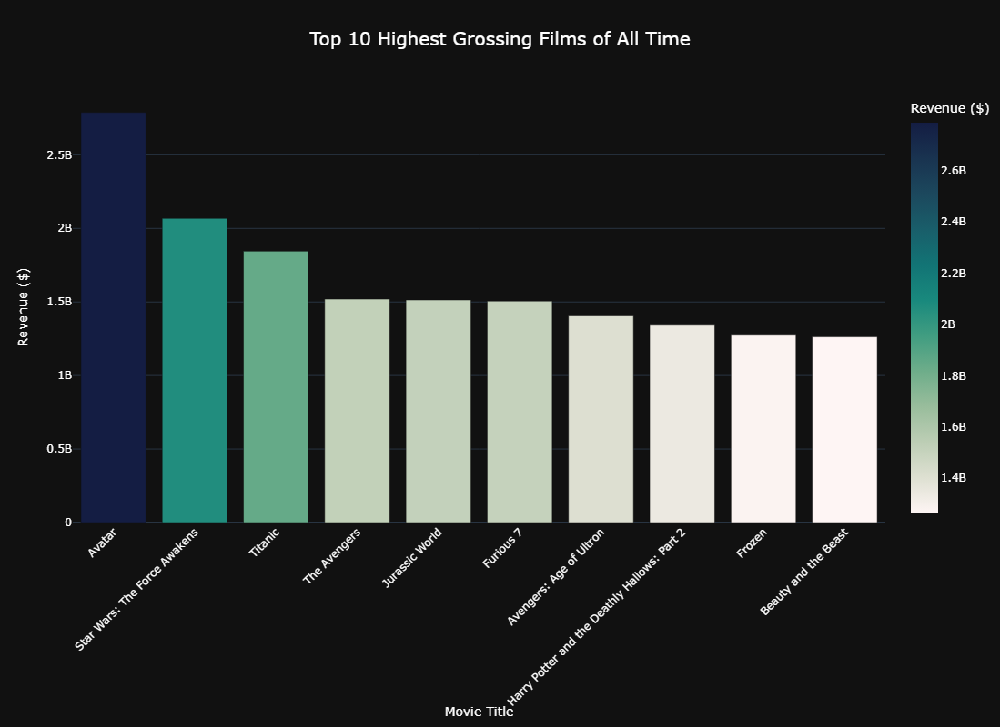

In [127]:
top_10_movies = df.sort_values(by='revenue', ascending=False).head(10)

fig = px.bar(top_10_movies, 
             x='title', 
             y='revenue', 
             hover_data=['budget', 'Year'],
             color = 'revenue',
             color_continuous_scale= 'tempo',
             labels={'revenue': 'Revenue ($)', 'title': 'Movie Title'},
             title='Top 10 Highest Grossing Films of All Time',
             template='plotly_dark')

fig.update_layout(
    xaxis_title='Movie Title',
    yaxis_title='Revenue ($)',
    title_x = 0.5,
    xaxis_tickangle=-45,
    font=dict(color='white'),
    height = 800,
    width = 800,
    title_font=dict(size=20)
)

fig.show()

The top 10 highest-grossing films of all time are led by *Avatar* (2009) with $2.79 billion. Other major earners include *Star Wars: The Force Awakens* (2015), *Titanic* (1997), and several films from *The Avengers*, *Jurassic World*, and *Frozen* franchises. These films achieved massive global success through high budgets and dedicated fan bases.

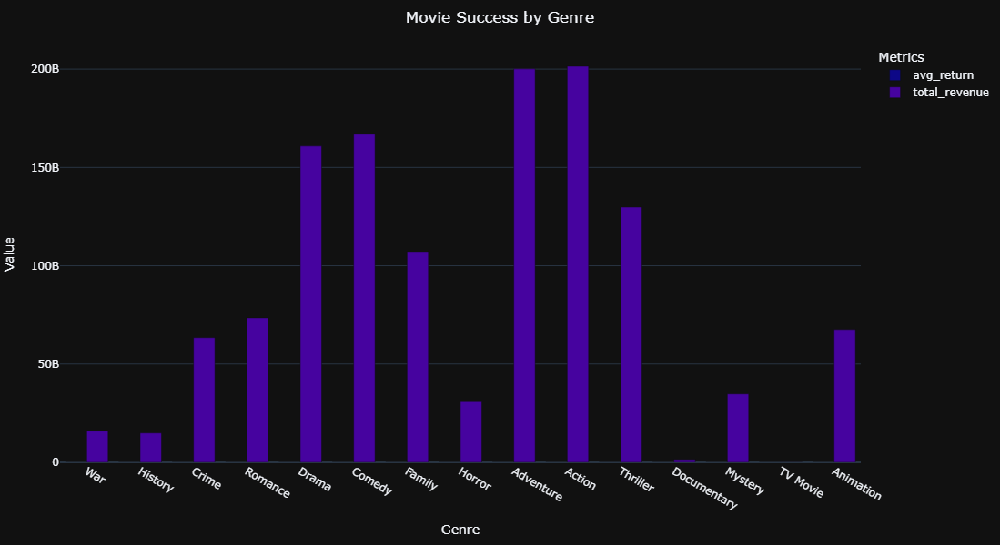

In [130]:
df_exploded = df.explode('genre_list').rename(columns={"genre_list": "genre"})

genre_success = df_exploded.groupby('genre').agg(
    avg_return=('return', 'mean'),
    total_revenue=('revenue', 'sum'),
    count=('genre', 'count')
).reset_index()

genre_success = genre_success.sort_values(by='avg_return', ascending=False).head(15)

fig = px.bar(
    genre_success,
    x='genre',
    y=['avg_return', 'total_revenue'],
    labels={'value': 'Metrics', 'variable': 'Success Metric'},
    title="Movie Success by Genre",
    template='plotly_dark',
    barmode='group',
    color_discrete_sequence=px.colors.sequential.Plasma
)

fig.update_layout(
    xaxis_title="Genre",
    yaxis_title="Value",
    legend_title="Metrics",
    title_x = 0.5,
    height=600,
    width = 800,
    margin=dict(t=50, b=50, l=50, r=50)
)

fig.show()

### Summary of Genre Success Based on Average Return and Total Revenue:

1. **Top Performing Genres (High Average Returns):**
   - **War** and **History** genres exhibit the highest average returns, with **War** achieving a remarkable average return of 20,580.72 and **History** close behind at 17,874.91. However, their total revenue contributions are moderate compared to more mainstream genres.
   - **Crime** and **Romance** follow, showing strong profitability with average returns exceeding 13,000.

2. **Mainstream Genres (High Total Revenue):**
   - **Action** and **Adventure** dominate in total revenue, generating over **$200 billion** each. Despite their massive revenue, their average returns are relatively low, indicating high budgets and moderate profitability.
   - **Drama** and **Comedy** contribute significantly to total revenue, with **Drama** leading at over **160 billion** and **Comedy** close behind.

3. **Family and Animation Success:**
   - **Family** movies generate over **100 billion** in total revenue but have a modest average return (1,920.08), reflecting their appeal to large audiences despite high production costs.
   - **Animation**, while contributing **67.5 billion** in revenue, shows low average returns (6.76), indicating significant investments in production.

4. **Niche and Low Performing Genres:**
   - **Documentary** and **Mystery** have low average returns, with **Documentary** producing only 105.99 in return despite over 3,900 entries.
   - **TV Movies** and **Animation** have the lowest average returns, likely due to limited commercial appeal or niche markets.

5. **Horror and Thriller Genres:**
   - **Horror** has a moderate total revenue of **$30 billion** but low average returns (1,746.95), indicating profitability for smaller productions.
   - **Thriller** combines high revenue (**129 billion**) with modest returns (671.04), reflecting its appeal across diverse audiences.

### Insights:
- Genres like **War**, **History**, and **Crime** deliver exceptional profitability, albeit with fewer movies.
- Blockbuster genres like **Action**, **Adventure**, **Drama**, and **Comedy** dominate total revenue, supporting their consistent appeal and global market share.
- Family-oriented genres and niche categories demonstrate varying profitability, often influenced by budgetary constraints and audience specificity.

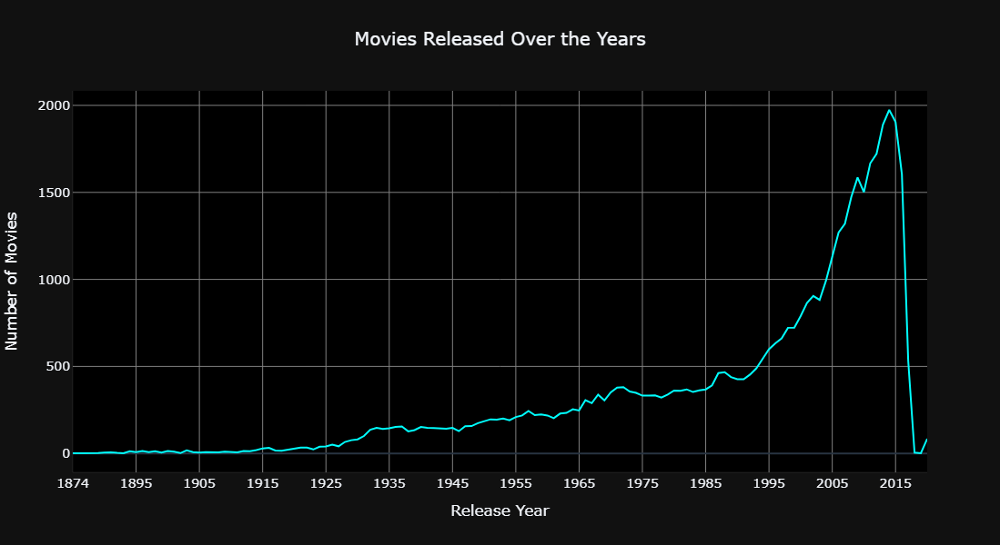

In [133]:
movies_per_year = df.groupby('Year')['title'].count().reset_index()
movies_per_year.rename(columns={'title': 'count'}, inplace=True)

movies_per_year = movies_per_year.sort_values(by='Year')


fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=movies_per_year['Year'],
        y=movies_per_year['count'],
        mode='lines',
        line=dict(color='cyan', width=2),
        hovertemplate="<b>Year:</b> %{x}<br><b>Movies Released:</b> %{y}<extra></extra>",
        name='Movies Released'
    )
)

fig.update_layout(
    template='plotly_dark',
    title=dict(
        text='Movies Released Over the Years',
        x=0.5,
        xanchor='center',
        font=dict(size=20)
    ),
    xaxis=dict(
        title='Release Year',
        tickmode='linear',
        tick0=1980,
        dtick=10, 
        showgrid=True,
        linewidth=0.1,
        gridcolor='gray',
        linecolor='white'
    ),
    yaxis=dict(
        title='Number of Movies',
        showgrid=True,
        linewidth=0.1,
        gridcolor='gray',
        linecolor='white'
    ),
    plot_bgcolor='black',
    hovermode='x unified',
    font=dict(size=14),
    height = 600,
    width = 800
)

fig.show()

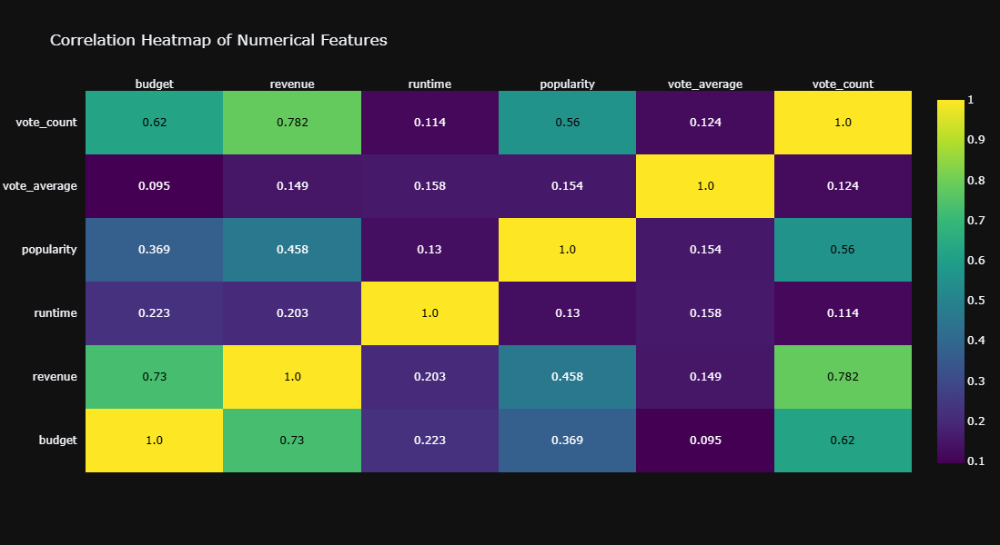

In [135]:
import plotly.figure_factory as ff

numerical_cols = ['budget', 'revenue', 'runtime', 'popularity', 'vote_average', 'vote_count']

correlation_matrix = df[numerical_cols].corr()

fig = ff.create_annotated_heatmap(
    z=np.round(correlation_matrix.values,3),
    x=numerical_cols,
    y=numerical_cols,
    colorscale='Viridis',
    showscale=True
)
fig.update_layout(title="Correlation Heatmap of Numerical Features", 
                  template="plotly_dark",
                 height = 600,
                 width = 700)
fig.show()


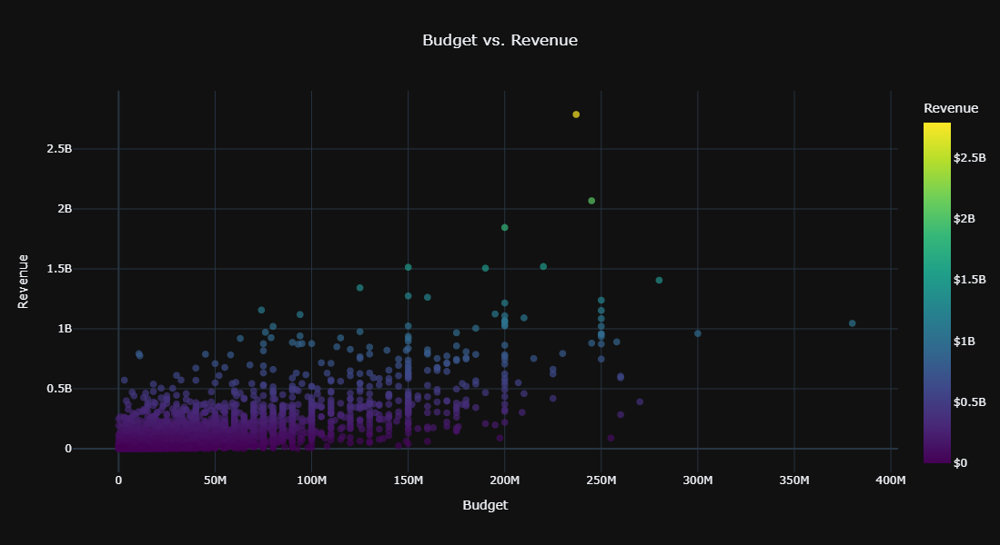

In [137]:
fig = px.scatter(
    df, 
    x='budget', 
    y='revenue', 
    color='revenue',
    color_continuous_scale='Viridis', 
    title="Budget vs. Revenue",
    hover_data=['title'],  
    labels={'revenue': 'Revenue', 'budget': 'Budget'}
)

fig.update_traces(marker=dict(size=8, opacity=0.7))
fig.update_layout(
    template='plotly_dark',
    title_x = 0.5,
    height=600,
    width=800,
    coloraxis_colorbar=dict(title="Revenue", tickprefix="$")
)

fig.show()


- **Budget and Revenue:** Higher budgets strongly correlate with increased revenue, emphasizing the importance of strategic investments in production and marketing.
- **Revenue and Vote Count:** Revenue correlates with higher audience engagement, which is reflected in vote counts, highlighting the link between success and popularity.

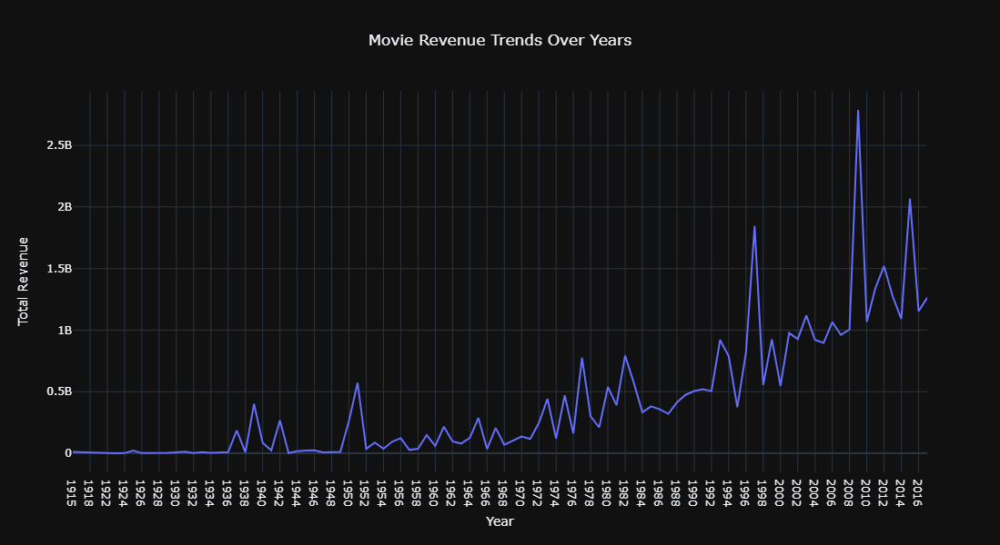

In [140]:
revenue_by_year = df[(df['revenue'].notnull()) & (df['Year'] != 'NaT')].groupby('Year')['revenue'].max().reset_index()

fig = px.line(
    revenue_by_year, 
    x='Year', 
    y='revenue', 
    title="Movie Revenue Trends Over Years",
    labels={'release_year': 'Release Year', 'revenue': 'Total Revenue'},
)

fig.update_layout(template='plotly_dark',
                  title_x = 0.5,
                  height=600,
                  width=800)
fig.show()


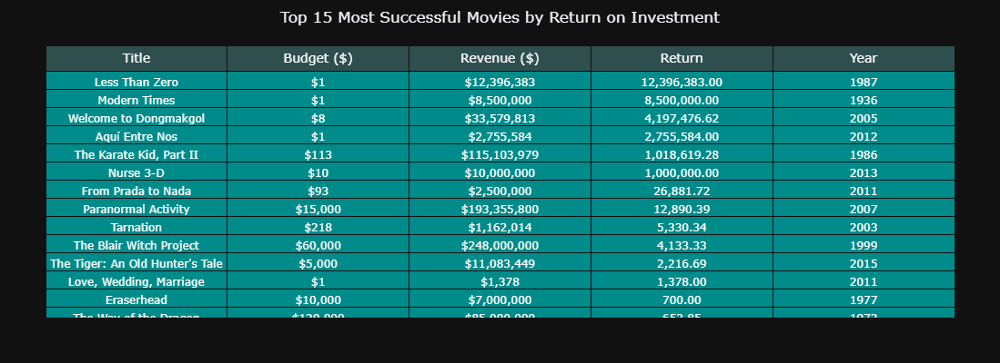

In [164]:

fig = go.Figure(data=[go.Table(
    header=dict(values=['Title', 'Budget ($)', 'Revenue ($)', 'Return', 'Year'],
                fill_color='darkslategray', font=dict(color='white', size=14),
                align='center'),
    cells=dict(values=[top_15_movies['title'], 
                       top_15_movies['budget'].apply(lambda x: f"${x:,.0f}"), 
                       top_15_movies['revenue'].apply(lambda x: f"${x:,.0f}"), 
                       top_15_movies['return'].apply(lambda x: f"{x:,.2f}"), 
                       top_15_movies['Year']],
               fill_color='darkcyan', font=dict(color='white'),
               align='center'))
])

fig.update_layout(
    title="Top 15 Most Successful Movies by Return on Investment",
    title_x = 0.5,
    template = "plotly_dark",
    height =400,
    margin=dict(t=50, b=50, l=50, r=50)
)

fig.show()

In [145]:
df_filtered = df[['title', 'budget', 'revenue', 'return', 'Year']].dropna()
df_filtered = df_filtered[df_filtered['budget'] > 0]

df_sorted = df_filtered.sort_values(by='return', ascending=False)

top_15_movies = df_sorted.head(15)
data = {"poster_url": [
       "https://upload.wikimedia.org/wikipedia/en/3/34/Less_than_zero_1987_poster.jpg",
        "https://upload.wikimedia.org/wikipedia/commons/3/36/Modern_Times_poster.jpg",
        "https://upload.wikimedia.org/wikipedia/en/c/c0/Welcome_to_Dongmakgol_poster.jpg",
        "https://upload.wikimedia.org/wikipedia/en/6/60/Between_Us_%282011_film%29_poster.jpg",
        "https://upload.wikimedia.org/wikipedia/en/b/b5/Karate_kid_part_II.jpg",
        "https://upload.wikimedia.org/wikipedia/en/3/30/Nurse3D.jpg",
        "https://upload.wikimedia.org/wikipedia/en/c/c3/From_Prada_to_Nada_Poster.jpg",
        "https://upload.wikimedia.org/wikipedia/en/5/54/Paranormal_Activity_poster.jpg",
        "https://upload.wikimedia.org/wikipedia/en/9/9b/TarnationPOSTER11.jpg",
        "https://upload.wikimedia.org/wikipedia/en/2/26/Blair_Witch_Project.jpg",
        "https://upload.wikimedia.org/wikipedia/en/5/54/The_Tiger_An_Old_Hunter%27s_Tale_poster.jpeg",
        "https://upload.wikimedia.org/wikipedia/en/6/6f/Love%2C_Wedding%2C_Marriage_Poster.jpg",
        "https://upload.wikimedia.org/wikipedia/commons/thumb/1/18/Eraserhead.jpg/683px-Eraserhead.jpg",
        "https://upload.wikimedia.org/wikipedia/en/b/bd/Way-of-the-dragon-poster.jpg",
        "https://upload.wikimedia.org/wikipedia/en/5/50/Pink_Flamingos_%281972%29.jpg"
    ]
}
top_15_movies['poster_url'] = data['poster_url']
top_15_movies['Image'] = top_15_movies['poster_url'].apply(lambda x: f'<img src="{x}" style="height:100px;">')

In [156]:
import io
from flask import Flask, send_file
from dash import Dash, dash_table, html

server = Flask(__name__)
app = Dash(__name__)

app.layout = html.Div([
    html.H1("Top 15 Most Successful Movies by Return on Investment", style={"textAlign": "center"}),
    dash_table.DataTable(
        id="table",
        columns=[
            {"name": "Poster", "id": "Image", "presentation": "markdown"},
            {"name": "Title", "id": "title"},
            {"name": "Budget ($)", "id": "budget"},
            {"name": "Revenue ($)", "id": "revenue"},
            {"name": "Year", "id": "Year"},
        ],
        data=top_15_movies.to_dict('records'),
        style_cell={'textAlign': 'center'},
        style_table={'overflowX': 'auto'},
        style_data_conditional=[
            {'if': {'column_id': 'Image'}, 'textAlign': 'centre'}
        ],
        markdown_options={"html": True},
    ),
    html.Br(),
    html.A("Download Data as CSV", href="/download_csv", target="_blank")
])

@server.route("/download_csv")
def download_csv():
    output = io.StringIO()
    df.to_csv(output, index=False)
    output.seek(0)
    return Response(
        output.getvalue(),
        mimetype="text/csv",
        headers={"Content-Disposition": "attachment;filename=highest_grossing_movies.csv"}
    )

if __name__ == '__main__':
    app.run_server(debug=True)

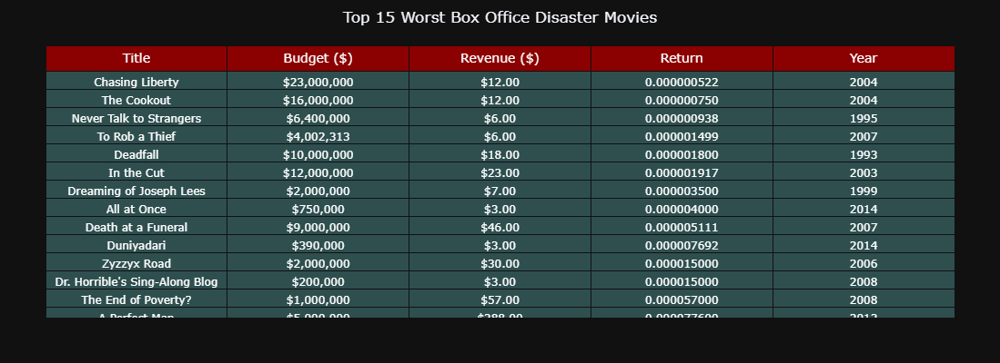

In [166]:
df_disasters = df_filtered[df_filtered['return'] < 1]


df_sorted_disasters = df_disasters.sort_values(by='return')

top_15_disasters = df_sorted_disasters.head(15)

fig = go.Figure(data=[go.Table(
    header=dict(values=['Title', 'Budget ($)', 'Revenue ($)', 'Return', 'Year'],
                fill_color='darkred', font=dict(color='white', size=14),
                align='center'),
    cells=dict(values=[top_15_disasters['title'], 
                       top_15_disasters['budget'].apply(lambda x: f"${x:,.0f}"), 
                       top_15_disasters['revenue'].apply(lambda x: f"${x:,.2f}"), 
                       top_15_disasters['return'].apply(lambda x: f"{x:,.9f}"), 
                       top_15_disasters['Year']],
               fill_color='darkslategray', font=dict(color='white'),
               align='center'))
])

fig.update_layout(
    title="Top 15 Worst Box Office Disaster Movies",
    title_x = 0.5,
    template='plotly_dark',
    height=400,
    margin=dict(t=50, b=50, l=50, r=50)
)

fig.show()

In [153]:
df.to_csv('filtered_movies.csv', index=False)

print("Filtered DataFrame saved as 'filtered_movies.csv'.")

Filtered DataFrame saved as 'filtered_movies.csv'.


### Conclusion for the Movie Analysis Notebook

In this notebook, we conducted a comprehensive analysis of the Movielens movie dataset, focusing on various aspects such as:

1. **Most Popular Spoken Languages**:  
   Identified English as the dominant spoken language in movies, followed by Français, Español, and Deutsch.

2. **Number of Movies Released Over the Years**:  
   Explored trends in movie releases, showing significant growth over the decades with visual insights.

3. **Top Original Language Movies**:  
   Highlighted movies with English as the most frequent original language, along with other notable languages like French, Japanese, and Italian.

4. **Most Expensive Movies**:  
   Examined movies with the highest budgets, revealing top films like *Pirates of the Caribbean: On Stranger Tides*, *Avengers: Age of Ultron*, and *Spider-Man 3*.

5. **Highest-Grossing Films of All Time**:  
   Created a visually appealing table with posters, budgets, revenues, and release years for the top 10 films, including *Avatar*, *Titanic*, and *The Avengers*.

Through these analyses, we gained valuable insights into movie production trends, financial success, and language diversity in the film industry.

### Next Steps:
The next phase of the project will delve into the detailed analysis of the **cast and crew credits** associated with the movies. This will provide deeper insights into the contributions of actors, directors, and other crew members to the success of films.

This concludes the current notebook. Stay tuned for further exploration in the next notebook! 😊